# Telecom Churn Case Study

## Problem statement

In the telecom industry, customers are able to choose from multiple service providers and actively switch from one operator to another. In this highly competitive market, the telecommunications industry experiences an average of 15-25% annual churn rate. Given the fact that it costs 5-10 times more to acquire a new customer than to retain an existing one, customer retention has now become even more important than customer acquisition.

For many incumbent operators, retaining high profitable customers is the number one business goal.

To reduce customer churn, telecom companies need to predict which customers are at high risk of churn.

Here we will analyse customer-level data of a leading telecom firm, spanning 4 month period from June to September, build predictive models to identify customers at high risk of churn and identify the main indicators of churn.

 - As approximately 80% of revenue comes from the top 20% customers (called high-value customers), we need to predict churn in high-value Prepaid customers who have not done any usage, either incoming or outgoing - in terms of calls, internet etc. over a period of time.

 - To predict customer churn in 9th month with the data from the 6th, 7th and 8th month.

## Background

Customers usually do not decide to switch to another competitor instantly, but rather over a period of time (this is especially applicable to high-value customers). In churn prediction, we assume that there are **three phases of customer lifecycle** :

1. The **‘good’ phase**: In this phase, the customer is happy with the service and behaves as usual.

2. The **‘action’ phase**: The customer experience starts to sour in this phase, for e.g. he/she gets a compelling offer from a  competitor, faces unjust charges, becomes unhappy with service quality etc. In this phase, the customer usually shows different behaviour than the ‘good’ months. Also, it is crucial to identify high-churn-risk customers in this phase, since some corrective actions can be taken at this point (such as matching the competitor’s offer/improving the service quality etc.)

3. The **‘churn’ phase**: In this phase, the customer is said to have churned. 

As we are working over a **four-month window**, 
 - the first two months(**6th and 7th**) are the **‘good’ phase**,
 - the third month(**8th**) is the **‘action’ phase**,
 - while the fourth month(**9th**) is the **‘churn’ phase**.

## Goals of the Case Study

1. Predict whether a high-value customer will churn or not, in near future (i.e. churn phase) to allow the company to take action steps such as providing special plans, discounts on recharge etc to prevent churn.

2. Identify important variables that are strong predictors of churn. These variables may also indicate why customers choose to switch to other networks.

## Importing libraries

In [12]:
# Load the libraries
import pandas as pd, numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [13]:
# Suppressing Warnings
import warnings
warnings.filterwarnings('ignore')

In [14]:
# Setting display options
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

## Importing Data

In [16]:
teldf=pd.read_csv(r"C:\Users\Niharika\Downloads\telecom_churn_dataCaseStudyMod25.csv")
teldf.head()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_t2c_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_t2o_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,date_of_last_rech_data_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
0,7000842753,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,197.385,214.816,213.803,21.100,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,0.00,0.00,0.00,0.00,NaN,NaN,0.16,NaN,NaN,NaN,4.13,NaN,NaN,NaN,1.15,NaN,NaN,NaN,5.44,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,0.00,0.00,5.44,0.00,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,4,3,

## Data Dictionary

In [18]:
telecom_data_dict = pd.read_excel(r"C:\Users\Niharika\Downloads\Data+Dictionary-+Telecom+Churn+Case+StudyMod25.xlsx")
telecom_data_dict

,Acronyms,Descriptions
0,MOBILE_NUMBER,Customer phone number
1,CIRCLE_ID,Telecom circle area to which the customer belo...
2,LOC,Local calls - within same telecom circle
3,STD,STD calls - outside the calling circle
4,IC,Incoming calls
5,OG,Outgoing calls
6,T2T,"Operator T to T, i.e. within same operator (mo..."
7,T2M,Operator T to other operator mobile
8,T2O,Operator T to other operator fixed line
9,T2F,Operator T to fixed lines of T


In [19]:
# Shape of df
teldf.shape

(99999, 226)

In [20]:
# Info of df
teldf.info(verbose=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99999 entries, 0 to 99998
Data columns (total 226 columns):
 #    Column                    Dtype  
---   ------                    -----  
 0    mobile_number             int64  
 1    circle_id                 int64  
 2    loc_og_t2o_mou            float64
 3    std_og_t2o_mou            float64
 4    loc_ic_t2o_mou            float64
 5    last_date_of_month_6      object 
 6    last_date_of_month_7      object 
 7    last_date_of_month_8      object 
 8    last_date_of_month_9      object 
 9    arpu_6                    float64
 10   arpu_7                    float64
 11   arpu_8                    float64
 12   arpu_9                    float64
 13   onnet_mou_6               float64
 14   onnet_mou_7               float64
 15   onnet_mou_8               float64
 16   onnet_mou_9               float64
 17   offnet_mou_6              float64
 18   offnet_mou_7              float64
 19   offnet_mou_8              float64
 20   offn

In [21]:
# Checking missing values in df
teldf.isnull().sum()

mobile_number                   0
circle_id                       0
loc_og_t2o_mou               1018
std_og_t2o_mou               1018
loc_ic_t2o_mou               1018
last_date_of_month_6            0
last_date_of_month_7          601
last_date_of_month_8         1100
last_date_of_month_9         1659
arpu_6                          0
arpu_7                          0
arpu_8                          0
arpu_9                          0
onnet_mou_6                  3937
onnet_mou_7                  3859
onnet_mou_8                  5378
onnet_mou_9                  7745
offnet_mou_6                 3937
offnet_mou_7                 3859
offnet_mou_8                 5378
offnet_mou_9                 7745
roam_ic_mou_6                3937
roam_ic_mou_7                3859
roam_ic_mou_8                5378
roam_ic_mou_9                7745
roam_og_mou_6                3937
roam_og_mou_7                3859
roam_og_mou_8                5378
roam_og_mou_9                7745
loc_og_t2t_mou

In [22]:
# Checking % of missing values in df
((teldf.isnull().sum()*100)/teldf.shape[0]).sort_values(ascending=False)

arpu_3g_6                   74.846748
night_pck_user_6            74.846748
total_rech_data_6           74.846748
arpu_2g_6                   74.846748
max_rech_data_6             74.846748
fb_user_6                   74.846748
av_rech_amt_data_6          74.846748
date_of_last_rech_data_6    74.846748
count_rech_2g_6             74.846748
count_rech_3g_6             74.846748
date_of_last_rech_data_7    74.428744
total_rech_data_7           74.428744
fb_user_7                   74.428744
max_rech_data_7             74.428744
night_pck_user_7            74.428744
count_rech_2g_7             74.428744
av_rech_amt_data_7          74.428744
arpu_2g_7                   74.428744
count_rech_3g_7             74.428744
arpu_3g_7                   74.428744
total_rech_data_9           74.077741
count_rech_3g_9             74.077741
fb_user_9                   74.077741
max_rech_data_9             74.077741
arpu_3g_9                   74.077741
date_of_last_rech_data_9    74.077741
night_pck_us

In [23]:
missing_value_cols=[]
for i in teldf.columns:
    if teldf[i].isnull().sum()!=0:
        missing_value_cols.append(i)
print(len(missing_value_cols)) 

166


<html><mark><b>166 columns have missing values</b></mark></html>

In [25]:
missing_value_50=[]
for i in teldf.columns:
    if (teldf[i].isnull().sum()*100)/teldf.shape[0]>50:
        missing_value_50.append(i)
print(len(missing_value_50)) 

40


<html><mark><b>40 columns have more than 50% missing values</b></mark></html>

In [27]:
# Dropping columns with more than 50% null values

teldf.drop(teldf[missing_value_50], axis=1, inplace=True)
teldf.shape

(99999, 186)

In [28]:
# Checking % of missing values in df
((teldf.isnull().sum()*100)/teldf.shape[0]).sort_values(ascending=False)

loc_og_t2m_mou_9        7.745077
loc_ic_t2m_mou_9        7.745077
offnet_mou_9            7.745077
std_ic_t2f_mou_9        7.745077
roam_ic_mou_9           7.745077
std_og_t2t_mou_9        7.745077
roam_og_mou_9           7.745077
std_ic_t2m_mou_9        7.745077
loc_og_t2t_mou_9        7.745077
std_ic_t2o_mou_9        7.745077
loc_og_mou_9            7.745077
std_ic_t2t_mou_9        7.745077
isd_og_mou_9            7.745077
loc_ic_t2f_mou_9        7.745077
loc_og_t2c_mou_9        7.745077
loc_og_t2f_mou_9        7.745077
loc_ic_t2t_mou_9        7.745077
std_og_t2m_mou_9        7.745077
spl_ic_mou_9            7.745077
std_ic_mou_9            7.745077
ic_others_9             7.745077
std_og_mou_9            7.745077
isd_ic_mou_9            7.745077
spl_og_mou_9            7.745077
onnet_mou_9             7.745077
std_og_t2c_mou_9        7.745077
loc_ic_mou_9            7.745077
og_others_9             7.745077
std_og_t2f_mou_9        7.745077
std_og_t2t_mou_8        5.378054
std_og_t2c

In [29]:
# Remove duplicates (if any are present in the dataset)
teldf.drop_duplicates(inplace = True)
teldf.shape

(99999, 186)

<html><mark><b>No duplicates found in the data</b></mark></html>

## Correcting Format of Data in Columns

In [32]:
# Checking columns which are named differently from other columns
import re
for i in teldf.columns:
    result = re.search('jul|aug|jun|sep',i)
    if result!=None:
        print(i)

aug_vbc_3g
jul_vbc_3g
jun_vbc_3g
sep_vbc_3g


In [33]:
# Replacing the above column names with correct format
teldf = teldf.rename(columns={'aug_vbc_3g': 'vbc_3g_8', 'jul_vbc_3g': 'vbc_3g_7', 'jun_vbc_3g': 'vbc_3g_6', 'sep_vbc_3g': 'vbc_3g_9'})
teldf.columns

Index(['mobile_number', 'circle_id', 'loc_og_t2o_mou', 'std_og_t2o_mou',
       'loc_ic_t2o_mou', 'last_date_of_month_6', 'last_date_of_month_7',
       'last_date_of_month_8', 'last_date_of_month_9', 'arpu_6',
       ...
       'monthly_3g_9', 'sachet_3g_6', 'sachet_3g_7', 'sachet_3g_8',
       'sachet_3g_9', 'aon', 'vbc_3g_8', 'vbc_3g_7', 'vbc_3g_6', 'vbc_3g_9'],
      dtype='object', length=186)

In [34]:
# Changing format of date columns from object to date-time format
teldf['last_date_of_month_6']=pd.to_datetime(teldf['last_date_of_month_6'])  
teldf['last_date_of_month_7']=pd.to_datetime(teldf['last_date_of_month_7'])
teldf['last_date_of_month_8']=pd.to_datetime(teldf['last_date_of_month_8'])
teldf['last_date_of_month_9']=pd.to_datetime(teldf['last_date_of_month_9'])

In [35]:
# Changing format of date columns from object to date-time format
teldf['date_of_last_rech_6']=pd.to_datetime(teldf['date_of_last_rech_6'])   
teldf['date_of_last_rech_7']=pd.to_datetime(teldf['date_of_last_rech_7'])   
teldf['date_of_last_rech_8']=pd.to_datetime(teldf['date_of_last_rech_8'])   
teldf['date_of_last_rech_9']=pd.to_datetime(teldf['date_of_last_rech_9']) 

## Removing Columns with only 1 Unique Value

In [37]:
# Checking the dataframe for columns with only 1 unique value as those columns will only convey limited information about the users
teldf.nunique()

mobile_number           99999
circle_id                   1
loc_og_t2o_mou              1
std_og_t2o_mou              1
loc_ic_t2o_mou              1
last_date_of_month_6        1
last_date_of_month_7        1
last_date_of_month_8        1
last_date_of_month_9        1
arpu_6                  85681
arpu_7                  85308
arpu_8                  83615
arpu_9                  79937
onnet_mou_6             24313
onnet_mou_7             24336
onnet_mou_8             24089
onnet_mou_9             23565
offnet_mou_6            31140
offnet_mou_7            31023
offnet_mou_8            30908
offnet_mou_9            30077
roam_ic_mou_6            6512
roam_ic_mou_7            5230
roam_ic_mou_8            5315
roam_ic_mou_9            4827
roam_og_mou_6            8038
roam_og_mou_7            6639
roam_og_mou_8            6504
roam_og_mou_9            5882
loc_og_t2t_mou_6        13539
loc_og_t2t_mou_7        13411
loc_og_t2t_mou_8        13336
loc_og_t2t_mou_9        12949
loc_og_t2m

In [38]:
# making a list of columns with only 1 unique value
one_nunique=[]
for i in teldf.columns:
    if teldf[i].nunique()==1:
        one_nunique.append(i)
        print(f"Unique value in {i} is: {teldf[i].unique()}\n")
print(len(one_nunique)) 
print(one_nunique)

Unique value in circle_id is: [109]

Unique value in loc_og_t2o_mou is: [ 0. nan]

Unique value in std_og_t2o_mou is: [ 0. nan]

Unique value in loc_ic_t2o_mou is: [ 0. nan]

Unique value in last_date_of_month_6 is: <DatetimeArray>
['2014-06-30 00:00:00']
Length: 1, dtype: datetime64[ns]

Unique value in last_date_of_month_7 is: <DatetimeArray>
['2014-07-31 00:00:00', 'NaT']
Length: 2, dtype: datetime64[ns]

Unique value in last_date_of_month_8 is: <DatetimeArray>
['2014-08-31 00:00:00', 'NaT']
Length: 2, dtype: datetime64[ns]

Unique value in last_date_of_month_9 is: <DatetimeArray>
['2014-09-30 00:00:00', 'NaT']
Length: 2, dtype: datetime64[ns]

Unique value in std_og_t2c_mou_6 is: [nan  0.]

Unique value in std_og_t2c_mou_7 is: [nan  0.]

Unique value in std_og_t2c_mou_8 is: [ 0. nan]

Unique value in std_og_t2c_mou_9 is: [nan  0.]

Unique value in std_ic_t2o_mou_6 is: [nan  0.]

Unique value in std_ic_t2o_mou_7 is: [nan  0.]

Unique value in std_ic_t2o_mou_8 is: [ 0. nan]

Unique v

<html><mark><b>The customers do not seem to be making any: 
     <ul>- Local outgoing calls to contacts on other operator fixed line</ul>
     <ul>- STD outgoing calls to contacts on other operator fixed line</ul>
     <ul>- Local international calls to contacts on other operator fixed line</ul></b></mark></html>

<html><mark><b>Looking at month-wise data, the customers do not seem to be making/ getting any: 
     <ul>- STD outgoing calls from Operator T to it’s own call center, for the month of June, July, August and September</ul>
     <ul>- STD incoming calls from Operator T to other operator fixed line, for the month of June, July, August and September</ul></b></mark></html>

In [41]:
# Dropping columns with only one unique value

teldf.drop(teldf[one_nunique], axis=1, inplace=True)
teldf.shape

(99999, 170)

## Feature Engineering

### Identifying High Value Customers

**High-value customers**: Those who have recharged with an amount more than or equal to **70th percentile of the average recharge amount** in the first two months (**June and July**).

In [45]:
# Checking columns which are named differently from other columns
import re
rech_columns=[]
for i in teldf.columns:
    result = re.search('rech',i)
    if result!=None:
        rech_columns.append(i)
        print(i)

total_rech_num_6
total_rech_num_7
total_rech_num_8
total_rech_num_9
total_rech_amt_6
total_rech_amt_7
total_rech_amt_8
total_rech_amt_9
max_rech_amt_6
max_rech_amt_7
max_rech_amt_8
max_rech_amt_9
date_of_last_rech_6
date_of_last_rech_7
date_of_last_rech_8
date_of_last_rech_9


In [46]:
# Calculating the Average recharge value per customer based on their recharge amounts in June and July
#teldf['avg_rech_amt_6n7'] = (teldf['total_rech_amt_6']+teldf['total_rech_amt_7'])/(teldf['total_rech_num_6']+teldf['total_rech_num_7'])
teldf['avg_rech_amt_6n7'] = (teldf['total_rech_amt_6']+teldf['total_rech_amt_7'])/2
teldf.avg_rech_amt_6n7.quantile(0.7)

368.5

In [47]:
# Checking for inclusion of new column
teldf.head()

,mobile_number,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,vbc_3g_8,vbc_3g_7,vbc_3g_6,vbc_3g_9,avg_rech_amt_6n7
0,7000842753,197.385,214.816,213.803,21.100,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,0.00,0.00,0.00,0.00,NaN,NaN,0.16,NaN,NaN,NaN,4.13,NaN,NaN,NaN,1.15,NaN,NaN,NaN,5.44,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,0.00,0.00,5.44,0.00,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,4,3,2,6,362,252,252,0,252,252,252,0,2014-06-21,2014-07-16,2014-08-08,2014-09-28,252,252,252,0,30.13,1.32,5.75,0.0,83.57,150.76,109.61,0.00,0,0,0,0,0,0,0,0,1,1,1,0,0,0,0,0,968,30.4,0.0,101.20,3.58,307.0
1,7001865778,34.047,355.074,268.321,86.285,24.11,78.68,7.68,18.34,15.74,99.84,304.76,53.76,0.0,0.00,0.00,0.00,0.0,0.00,0.00,0.00,23.88,74.56,7.68,18.34,11.51,75.94,291.86,53.76,0.00,0.00,0.00,0.00,0.0,2.91,0.00,0.00,35.39,150.51,299.54,72.11,0.23,4.11,0.00,0.00,0.00,0.46,0.13,0.00,0.00,0.00,0.00,0.0,0.23,4.58,0.13,0.00,0.0,0.0,0.0,0.0,4.68,23.43,12.76,0.00,0.00,0.0,0.0,0.0,40.31,178.53,312.44,72.11,1.61,29.91,29.23,116.09,17.48,65.38,375.58,56.93,0.00,8.93,3.61,0.00,19.09,104.23,408.43,173.03,0.00,0.00,2.35,0.00,5.90,0.00,12.49,15.01,0.00,0.00,0.00,0.00,5.90,0.00,14.84,15.01,26.83,104.23,423.28,188.04,0.00,0.0,0.0,0.00,1.83,0.00,0.0,0.00,0.00,0.00,0.0,0.00,4,9,11,5,74,384,283,121,44,154,65,50,2014-06-29,2014-07-31,2014-08-28,2014-09-30,44,23,30,0,0.00,108.07,365.47,0.0,0.00

In [48]:
# Checking the number of customers qualifying for high value customers
teldf[teldf['avg_rech_amt_6n7']>=teldf.avg_rech_amt_6n7.quantile(0.7)].shape

(30011, 171)

In [49]:
# Reducing the dataset to focus only on high value customers
hv_df=teldf[teldf['avg_rech_amt_6n7']>=teldf.avg_rech_amt_6n7.quantile(0.7)]
hv_df.shape

(30011, 171)

In [50]:
# Feature Engineering new columns to check call and data usage by customers in the month of September
hv_df['call_usage_9']=hv_df['total_ic_mou_9']+hv_df['total_og_mou_9']
hv_df['data_usage_9']=hv_df['vol_2g_mb_9']+hv_df['vol_3g_mb_9']

In [51]:
# Checking for inclusion of new columns
hv_df.head()

,mobile_number,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,vbc_3g_8,vbc_3g_7,vbc_3g_6,vbc_3g_9,avg_rech_amt_6n7,call_usage_9,data_usage_9
7,7000701601,1069.180,1349.850,3171.480,500.000,57.84,54.68,52.29,NaN,453.43,567.16,325.91,NaN,16.23,33.49,31.64,NaN,23.74,12.59,38.06,NaN,51.39,31.38,40.28,NaN,308.63,447.38,162.28,NaN,62.13,55.14,53.23,NaN,0.0,0.0,0.00,NaN,422.16,533.91,255.79,NaN,4.30,23.29,12.01,NaN,49.89,31.76,49.14,NaN,6.66,20.08,16.68,NaN,60.86,75.14,77.84,NaN,0.0,0.18,10.01,NaN,4.50,0.00,6.50,NaN,0.00,0.0,0.0,NaN,487.53,609.24,350.16,0.00,58.14,32.26,27.31,NaN,217.56,221.49,121.19,NaN,152.16,101.46,39.53,NaN,427.88,355.23,188.04,NaN,36.89,11.83,30.39,NaN,91.44,126.99,141.33,NaN,52.19,34.24,22.21,NaN,180.54,173.08,193.94,NaN,626.46,558.04,428.74,0.00,0.21,0.0,0.0,NaN,2.06,14.53,31.59,NaN,15.74,15.19,15.14,NaN,5,5,7,3,1580,790,3638,0,1580,790,1580,0,2014-06-27,2014-07-25,2014-08-26,2014-09-30,0,0,779,0,0.0,0.0,0.00,0.0,0.0,0.00,0.00,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,802,57.74,19.38,18.74,0.0,1185.0,0.00,0.0
8,7001524846,378.721,492.223,137.362,166.787,413.69,351.03,35.08,33.46,94.66,80.63,136.48,108.71,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,297.13,217.59,12.49,26.13,80.96,70.58,50.54,34.58,0.00,0.00,0.00,0.00,0.0,0.0,7.15,0.0,378.09,288.18,63.04,60.71,116.56,133.43,22.58,7.33,13.69,10.04,75.69,74.13,0.00,0.00,0.00,0.00,130.26,143.48,98.28,81.46,0.0,0.00,0.00,0.0,0.00,0.00,10.23,0.00,0.00,0.0,0.0,0.0,508.36,431.66,171.56,142.18,23.84,9.84,0.31,4.03,57.58,13.98,15.48,17.34,0.00,0.00,0.00,0.00,81.43,23.83,15.79,21.38,0.00,0.58,0.10,0.00,22.43,4.08,0.65,13.53,0.00,0.00,0.00,0.0,22.43,4.66,0.75,13.53,10

## Identifying customers at risk of Churn based on their usage patterns

In [53]:
# Checking the min value of 'call_usage_9' column
hv_df['call_usage_9'].min()

0.0

In [54]:
# Checking the min value of 'data_usage_9' column
hv_df['data_usage_9'].min()

0.0

In [55]:
# Checking the number of customers falling in the churn bucket
hv_df[(hv_df['call_usage_9']==hv_df['call_usage_9'].min()) & (hv_df['data_usage_9']==hv_df['data_usage_9'].min())].shape

(2593, 173)

In [56]:
# Applying the churn mapping on the complete data
hv_df['churn']=np.where((hv_df['call_usage_9']==hv_df['call_usage_9'].min()) & (hv_df['data_usage_9']==hv_df['data_usage_9'].min()),1,0)
hv_df.head(10)

,mobile_number,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,vbc_3g_8,vbc_3g_7,vbc_3g_6,vbc_3g_9,avg_rech_amt_6n7,call_usage_9,data_usage_9,churn
7,7000701601,1069.180,1349.850,3171.480,500.000,57.84,54.68,52.29,NaN,453.43,567.16,325.91,NaN,16.23,33.49,31.64,NaN,23.74,12.59,38.06,NaN,51.39,31.38,40.28,NaN,308.63,447.38,162.28,NaN,62.13,55.14,53.23,NaN,0.00,0.0,0.00,NaN,422.16,533.91,255.79,NaN,4.30,23.29,12.01,NaN,49.89,31.76,49.14,NaN,6.66,20.08,16.68,NaN,60.86,75.14,77.84,NaN,0.00,0.18,10.01,NaN,4.50,0.00,6.50,NaN,0.00,0.0,0.0,NaN,487.53,609.24,350.16,0.00,58.14,32.26,27.31,NaN,217.56,221.49,121.19,NaN,152.16,101.46,39.53,NaN,427.88,355.23,188.04,NaN,36.89,11.83,30.39,NaN,91.44,126.99,141.33,NaN,52.19,34.24,22.21,NaN,180.54,173.08,193.94,NaN,626.46,558.04,428.74,0.00,0.21,0.0,0.0,NaN,2.06,14.53,31.59,NaN,15.74,15.19,15.14,NaN,5,5,7,3,1580,790,3638,0,1580,790,1580,0,2014-06-27,2014-07-25,2014-08-26,2014-09-30,0,0,779,0,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,802,57.74,19.38,18.74,0.0,1185.0,0.00,0.00,1
8,7001524846,378.721,492.223,137.362,166.787,413.69,351.03,35.08,33.46,94.66,80.63,136.48,108.71,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,297.13,217.59,12.49,26.13,80.96,70.58,50.54,34.58,0.00,0.00,0.00,0.00,0.00,0.0,7.15,0.00,378.09,288.18,63.04,60.71,116.56,133.43,22.58,7.33,13.69,10.04,75.69,74.13,0.00,0.00,0.00,0.00,130.26,143.48,98.28,81.46,0.00,0.00,0.00,0.00,0.00,0.00,10.23,0.00,0.00,0.0,0.0,0.0,508.36,431.66,171.56,142.18,23.84,9.84,0.31,4.03,57.58,13.98,15.48,17.34,0.00,0.00,0.00,0.00,81.43,23.83,15.79,21.38,0.00,0.58,0.10,0.00,22.43,4.08,0.65,13.53,0.00,0.00,0.00,0.00,22.4

In [57]:
# Identifying all columns corresponding to the churn phase (all attributes having ‘ _9’, etc. in their names)
import re
september_columns=[]
for i in hv_df.columns:
    result = re.search('_9',i)
    if result!=None:
        september_columns.append(i)
print(september_columns)

['arpu_9', 'onnet_mou_9', 'offnet_mou_9', 'roam_ic_mou_9', 'roam_og_mou_9', 'loc_og_t2t_mou_9', 'loc_og_t2m_mou_9', 'loc_og_t2f_mou_9', 'loc_og_t2c_mou_9', 'loc_og_mou_9', 'std_og_t2t_mou_9', 'std_og_t2m_mou_9', 'std_og_t2f_mou_9', 'std_og_mou_9', 'isd_og_mou_9', 'spl_og_mou_9', 'og_others_9', 'total_og_mou_9', 'loc_ic_t2t_mou_9', 'loc_ic_t2m_mou_9', 'loc_ic_t2f_mou_9', 'loc_ic_mou_9', 'std_ic_t2t_mou_9', 'std_ic_t2m_mou_9', 'std_ic_t2f_mou_9', 'std_ic_mou_9', 'total_ic_mou_9', 'spl_ic_mou_9', 'isd_ic_mou_9', 'ic_others_9', 'total_rech_num_9', 'total_rech_amt_9', 'max_rech_amt_9', 'date_of_last_rech_9', 'last_day_rch_amt_9', 'vol_2g_mb_9', 'vol_3g_mb_9', 'monthly_2g_9', 'sachet_2g_9', 'monthly_3g_9', 'sachet_3g_9', 'vbc_3g_9', 'call_usage_9', 'data_usage_9']


In [58]:
# Deleting all columns having ‘ _9’, etc. in their names
hv_df.drop(hv_df[september_columns], axis=1, inplace=True)
hv_df.shape

(30011, 130)

In [59]:
# Dropping columns created to identify high value customers
hv_df.drop('avg_rech_amt_6n7', axis=1, inplace=True)
hv_df.shape

(30011, 129)

<Axes: xlabel='date_of_last_rech_8'>

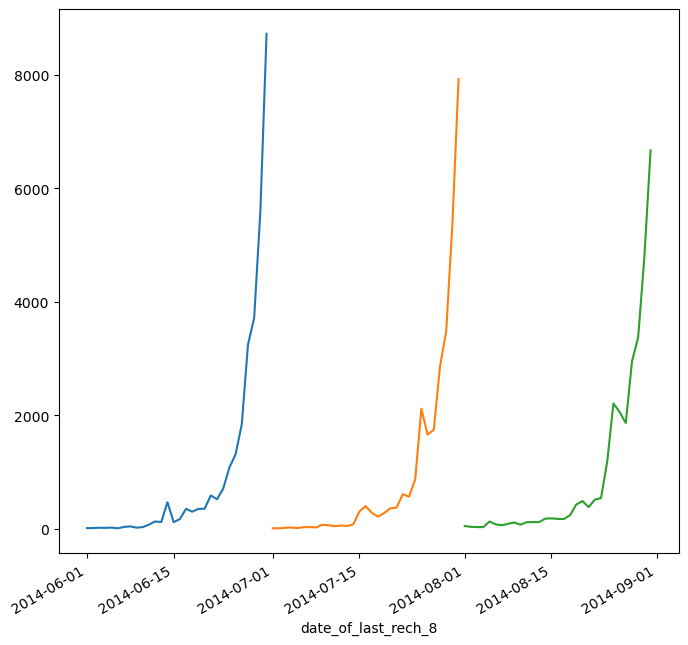

In [60]:
# Checking the plot of the 'date_of_last_rech' for the first 3 months
plt.figure(figsize=(8,8))
hv_df['date_of_last_rech_6'].value_counts().plot.line()
hv_df['date_of_last_rech_7'].value_counts().plot.line()
hv_df['date_of_last_rech_8'].value_counts().plot.line()

In [61]:
# Deleting all date columns as they are not useful for model building
hv_df.drop(hv_df[['date_of_last_rech_6','date_of_last_rech_7','date_of_last_rech_8']], axis=1, inplace=True)
hv_df.shape

(30011, 126)

In [62]:
# Checking missing values again
((hv_df.isnull().sum()*100)/len(hv_df)).sort_values(ascending=False)

loc_ic_t2f_mou_8      3.125521
loc_ic_t2t_mou_8      3.125521
loc_og_t2c_mou_8      3.125521
loc_og_mou_8          3.125521
std_og_t2t_mou_8      3.125521
std_og_t2m_mou_8      3.125521
std_og_t2f_mou_8      3.125521
std_og_mou_8          3.125521
isd_og_mou_8          3.125521
spl_og_mou_8          3.125521
loc_ic_t2m_mou_8      3.125521
loc_og_t2m_mou_8      3.125521
loc_ic_mou_8          3.125521
std_ic_t2t_mou_8      3.125521
std_ic_t2m_mou_8      3.125521
std_ic_t2f_mou_8      3.125521
std_ic_mou_8          3.125521
spl_ic_mou_8          3.125521
isd_ic_mou_8          3.125521
ic_others_8           3.125521
loc_og_t2f_mou_8      3.125521
og_others_8           3.125521
offnet_mou_8          3.125521
roam_og_mou_8         3.125521
onnet_mou_8           3.125521
roam_ic_mou_8         3.125521
loc_og_t2t_mou_8      3.125521
loc_og_t2f_mou_6      1.052947
std_ic_t2f_mou_6      1.052947
roam_og_mou_6         1.052947
spl_og_mou_6          1.052947
og_others_6           1.052947
std_ic_t

In [63]:
# Replacing null values with 0 as it indicates that customer did not recharge and thus did not have charge to take calls
hv_df.fillna(0,inplace=True)
hv_df.head()

,mobile_number,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,vbc_3g_8,vbc_3g_7,vbc_3g_6,churn
7,7000701601,1069.180,1349.850,3171.480,57.84,54.68,52.29,453.43,567.16,325.91,16.23,33.49,31.64,23.74,12.59,38.06,51.39,31.38,40.28,308.63,447.38,162.28,62.13,55.14,53.23,0.0,0.0,0.00,422.16,533.91,255.79,4.30,23.29,12.01,49.89,31.76,49.14,6.66,20.08,16.68,60.86,75.14,77.84,0.0,0.18,10.01,4.50,0.00,6.50,0.00,0.0,0.0,487.53,609.24,350.16,58.14,32.26,27.31,217.56,221.49,121.19,152.16,101.46,39.53,427.88,355.23,188.04,36.89,11.83,30.39,91.44,126.99,141.33,52.19,34.24,22.21,180.54,173.08,193.94,626.46,558.04,428.74,0.21,0.0,0.0,2.06,14.53,31.59,15.74,15.19,15.14,5,5,7,1580,790,3638,1580,790,1580,0,0,779,0.0,0.0,0.00,0.0,0.00,0.00,0,0,0,0,0,0,0,0,0,0,0,0,802,57.74,19.38,18.74,1
8,7001524846,378.721,492.223,137.362,413.69,351.03,35.08,94.66,80.63,136.48,0.00,0.00,0.00,0.00,0.00,0.00,297.13,217.59,12.49,80.96,70.58,50.54,0.00,0.00,0.00,0.0,0.0,7.15,378.09,288.18,63.04,116.56,133.43,22.58,13.69,10.04,75.69,0.00,0.00,0.00,130.26,143.48,98.28,0.0,0.00,0.00,0.00,0.00,10.23,0.00,0.0,0.0,508.36,431.66,171.56,23.84,9.84,0.31,57.58,13.98,15.48,0.00,0.00,0.00,81.43,23.83,15.79,0.00,0.58,0.10,22.43,4.08,0.65,0.00,0.00,0.00,22.43,4.66,0.75,103.86,28.49,16.54,0.00,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,19,21,14,437,601,120,90,154,30,50,0,10,0.0,356.0,0.03,0.0,750.95,11.94,0,1,0,0,1,3,0,0,0,0,0,0,315,21.03,910.65,122.16,0
13,7002191713,492.846,205.671,593.260,501.76,108.39,534.24,413.31,119.28,482.46,23.53,144.24,72.11,7.98,35.26,1.44,49.63,6.19,36.01,151.13,47.28,294.46,4.54,0.00,23.51,0.0,0.0,0.49,205.31,53.48,353.99,446.41,85.98,498.23,255.36,52.94,156.94,0.00,0.00,0.00,701.78,138.93,655.18,0.0,0.00,1.29,0.00,0.00,4.78,0.00,0.0,0.0,907.09,192.41,1015.26,67.88,7.58,52.58,142.88,18.53,195.18,4.81,0.00,7.49,215.58,26.11,255.26,115.68,38.29,154.58,308.13,29.79,317.91,0.00,0.00,1.91,423.81,68.09,474.41,968.61,172.58,1144.53,0.45,0.0,0.0,245.28,62.11,393.39,83.48,16.24,21.44,6,4,11,507,253,717,110,110,130,110,50,0,0.0,0.0,0.02,0.0,0.00,0.00,0,0,0,0,0,3,0,0,0,0,0,0,2607,0.00,0.00,0.00,0
16,7000875565,430.975,299.869,187.894,50.51,74.01,70.61,296.29,229.74,162.76,0.00,2.83,0.00,0.00,17.74,0.00,42.61,65.16,67.38,273.29,145.99,128.28,0.00,4.48,10.26,0.0,0.0,0.00,315.91,215.64,205.93,7.89,2.58,

In [64]:
# Checking missing values again
((hv_df.isnull().sum()*100)/len(hv_df)).sort_values(ascending=False)

mobile_number         0.0
total_ic_mou_6        0.0
total_rech_num_7      0.0
total_rech_num_6      0.0
ic_others_8           0.0
ic_others_7           0.0
ic_others_6           0.0
isd_ic_mou_8          0.0
isd_ic_mou_7          0.0
isd_ic_mou_6          0.0
spl_ic_mou_8          0.0
spl_ic_mou_7          0.0
spl_ic_mou_6          0.0
total_ic_mou_8        0.0
total_ic_mou_7        0.0
std_ic_mou_8          0.0
total_rech_amt_6      0.0
std_ic_mou_7          0.0
std_ic_mou_6          0.0
std_ic_t2f_mou_8      0.0
std_ic_t2f_mou_7      0.0
std_ic_t2f_mou_6      0.0
std_ic_t2m_mou_8      0.0
std_ic_t2m_mou_7      0.0
std_ic_t2m_mou_6      0.0
std_ic_t2t_mou_8      0.0
std_ic_t2t_mou_7      0.0
std_ic_t2t_mou_6      0.0
loc_ic_mou_8          0.0
loc_ic_mou_7          0.0
total_rech_num_8      0.0
total_rech_amt_7      0.0
arpu_6                0.0
monthly_2g_8          0.0
vbc_3g_6              0.0
vbc_3g_7              0.0
vbc_3g_8              0.0
aon                   0.0
sachet_3g_8 

## Imbalance Ratio

In [66]:
# Calculating the ratio of Churn vs. Non-Churn customers to check data imbalance
(hv_df['churn'].value_counts()*100)/len(hv_df)

churn
0    91.359835
1     8.640165
Name: count, dtype: float64

In [67]:
# Checking for imbalance in the dataset 
(len(hv_df[hv_df['churn']==1])/len(hv_df[hv_df['churn']==0]))

0.09457290830841053

<Axes: xlabel='churn'>

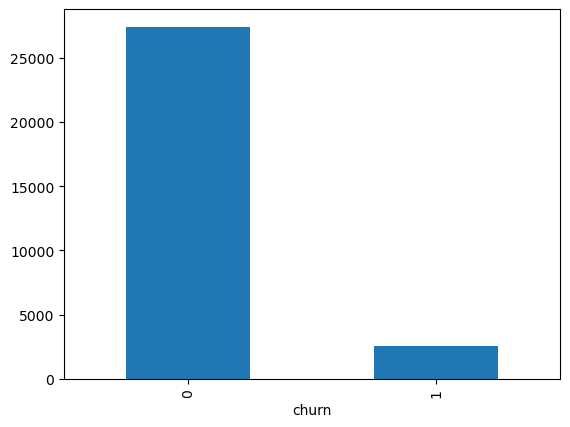

In [68]:
hv_df['churn'].value_counts().plot.bar()

<div class="alert alert-block alert-info">
<b>Insight</b>
    
 - With imbalance ratio at 0.095, the dataset is extremely imbalanced with Majority class being 'not churn' and Minority class being 'churn'. 

</div>

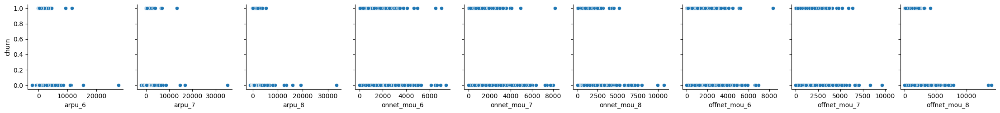

In [70]:
# Let's see how 'churn' is related with other numerical variables using scatter plot
sns.pairplot(hv_df, x_vars=['arpu_6', 'arpu_7', 'arpu_8', 'onnet_mou_6',
       'onnet_mou_7', 'onnet_mou_8', 'offnet_mou_6', 'offnet_mou_7',
       'offnet_mou_8'], y_vars='churn', kind='scatter')
plt.show()

In [71]:
corr_mat=hv_df.corr(numeric_only=True)
corr_mat

,mobile_number,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,vbc_3g_8,vbc_3g_7,vbc_3g_6,churn
mobile_number,1.000000,0.014114,0.009008,0.018085,-0.010772,-0.013823,-0.009466,0.001612,-0.007911,0.002887,0.007482,-0.003537,0.001682,-0.000647,-0.004968,-0.007281,0.042982,0.041525,0.041179,0.076031,0.072273,0.077474,0.052105,0.052740,0.055087,-0.018836,-0.019829,-0.014847,0.079948,0.076877,0.079052,-0.037290,-0.040032,-0.033275,-0.045534,-0.048767,-0.041467,0.027090,0.017889,0.020602,-0.055677,-0.060016,-0.049795,-0.004458,-0.003528,-0.004974,-0.026751,-0.029038,-0.021718,-0.016400,-0.000703,0.000701,-0.006254,-0.014884,-0.003538,0.027979,0.025138,0.027328,0.062944,0.058957,0.061430,0.052638,0.052070,0.051862,0.066575,0.062510,0.064664,-0.007750,-0.003129,-0.007353,-0.020658,-0.021685,-0.020706,0.014964,0.010616,0.013060,-0.017090,-0.015696,-0.017368,0.053602,0.049080,0.049767,-0.021272,-0.002866,-0.034164,0.011149,0.007521,0.004861,0.013486,0.012037,0.012915,-0.046411,-0.057582,-0.049460,0.013528,0.013119,0.016200,0.057833,0.054210,0.057652,0.044674,0.051417,0.043435,-0.007692,-0.013800,-0.012161,-0.013192,-0.003234,0.000428,0.014540,0.015730,0.013825,-0.018465,-0.016693,-0.011615,0.002837,0.002978,0.014741,-0.005937,-0.006469,-0.007831,0.315073,-0.024077,-0.020006,-0.031117,-0.039318
arpu_6,0.014114,1.000000,0.631581,0.570936,0.291288,0.142431,0.116476,0.459309,0.257895,0.209238,0.109162,0.069882,0.077812,0.176963,0.122399,0.107916,0.129194,0.086589,0.085121,0.276915,0.175359,0.154181,0.112236,0.082610,0.071729,0.045273,0.009153,0.004787,0.269509,0.174449,0.157259,0.234329,0.100276,0.074959,0.262791,0.121425,0.085729,0.051461,0.037400,0.026049,0.338514,0.151553,0.108352,0.481277,0.432633,0.425466,0.113180,0.050398,0.023539,0.086704,0.023286,0.014705,0.502950,0.267321,0.210000,0.066606,0.039024,0.040441,0.151346,0.104704,0.085222,0.041512,0.025531,0.024688,0.147276,0.097532,0.084259,0.074004,0.043102,0.040377,0.077415,0.041312,0.038892,0.024695,0.022107,0.015204,0.100740,0.056812,0.051990,0.188549,0.119397,0.104696,0.011835,-0.028108,-0.014938,0.114075,0.058845,0.058879,0.014150,0.023799,0.009025,0.330964,0.101415,0.086661,0.941256,0.608101,0.565462,0.313721,0.230572,0.257768,0.239042,0.168345,0.172094,0.030598,-0.001677,0.002541,0.216141,0.142724,0.147727,0.017

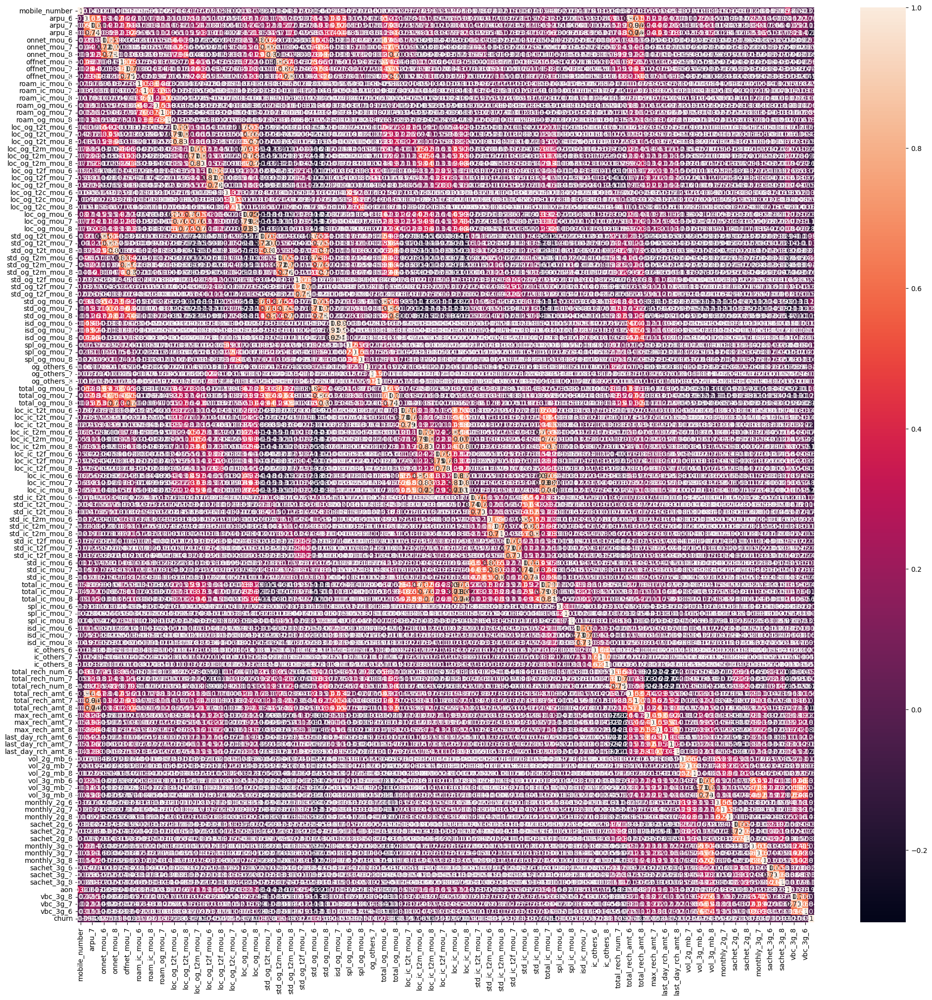

In [72]:
# Let's see the heatmap
plt.figure(figsize = (24,24))       
sns.heatmap(hv_df.corr(numeric_only=True),annot = True)
plt.show()

In [73]:
corr_mat.loc[:,:] = np.tril(corr_mat, k=-1)
corr_mat = corr_mat.stack()
corr_mat[(corr_mat > 0.80) | (corr_mat < -0.80)].sort_values(ascending=False)

total_rech_amt_8  arpu_8              0.953725
isd_og_mou_8      isd_og_mou_7        0.941347
total_rech_amt_6  arpu_6              0.941256
total_rech_amt_7  arpu_7              0.937114
isd_og_mou_8      isd_og_mou_6        0.916058
isd_og_mou_7      isd_og_mou_6        0.914963
total_ic_mou_6    loc_ic_mou_6        0.895624
total_ic_mou_8    loc_ic_mou_8        0.889933
total_ic_mou_7    loc_ic_mou_7        0.882860
std_og_t2t_mou_8  onnet_mou_8         0.857390
loc_ic_mou_8      loc_ic_t2m_mou_8    0.853509
std_og_t2t_mou_7  onnet_mou_7         0.853116
loc_ic_mou_6      loc_ic_t2m_mou_6    0.851870
std_og_t2m_mou_7  offnet_mou_7        0.851104
std_og_t2t_mou_6  onnet_mou_6         0.851039
std_og_t2m_mou_8  offnet_mou_8        0.848670
std_ic_mou_8      std_ic_t2m_mou_8    0.846061
total_og_mou_8    std_og_mou_8        0.843398
total_og_mou_7    std_og_mou_7        0.837854
loc_ic_mou_7      loc_ic_t2m_mou_7    0.834541
loc_ic_mou_8      loc_ic_mou_7        0.833639
loc_og_mou_8 

In [74]:
hv_df.describe()

,mobile_number,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,vbc_3g_8,vbc_3g_7,vbc_3g_6,churn
count,3.001100e+04,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.00000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.00000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.00000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000
mean,7.001223e+09,587.284404,589.135427,534.857433,296.034461,304.343206,267.600412,417.933372,423.924375,375.021691,17.412764,13.522114,13.25627,29.321648,22.036003,21.469272,94.680696,95.729729,87.139995,181.279583,181.271524,167.591199,6.97933,7.097268,6.494314,1.567160,1.862229,1.712739,282.948414,284.107492,261.233938,189.753131,199.877508,172.196408,203.097767,213.411914,179.568790,2.010766,2.034241,1.789728,394.865994,415.327988,353.558826,2.264425,2.207400,2.029314,5.916364,7.425487,6.885193,0.692507,0.047600,0.059131,686.697541,709.124730,623.774684

## Tracking trends over the first 3 months

In [76]:
# Combining similar parameters for the first 3 months in a list
arpu_cols = ['arpu_6', 'arpu_7', 'arpu_8']
onnet_cols = ['onnet_mou_6','onnet_mou_7','onnet_mou_8']
offnet_cols = ['offnet_mou_6','offnet_mou_7','offnet_mou_8']
total_og_cols = ['total_og_mou_6','total_og_mou_7','total_og_mou_8']
total_ic_cols = ['total_ic_mou_6','total_ic_mou_7','total_ic_mou_8']
roam_ic_cols = ['roam_ic_mou_6','roam_ic_mou_7','roam_ic_mou_8']
roam_og_cols = ['roam_og_mou_6','roam_og_mou_7','roam_og_mou_8']
loc_og_t2t_cols = ['loc_og_t2t_mou_6','loc_og_t2t_mou_7','loc_og_t2t_mou_8']
loc_og_t2m_cols = ['loc_og_t2m_mou_6','loc_og_t2m_mou_7','loc_og_t2m_mou_8']
std_og_cols = ['std_og_mou_6','std_og_mou_7','std_og_mou_8']
std_ic_cols = ['std_ic_mou_6','std_ic_mou_7','std_ic_mou_8']
isd_og_cols = ['isd_og_mou_6','isd_og_mou_7','isd_og_mou_8']
isd_ic_cols = ['isd_ic_mou_6','isd_ic_mou_7','isd_ic_mou_8']

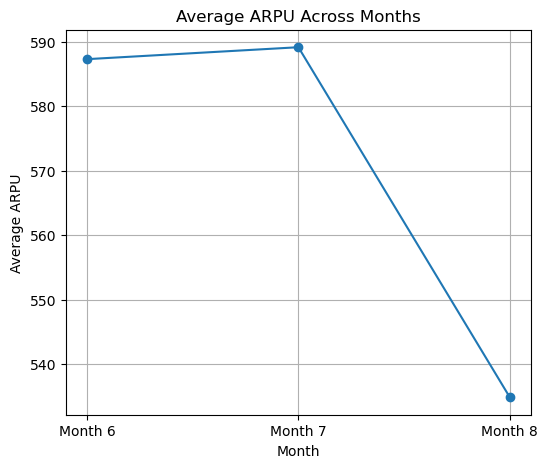

In [77]:
# For a high level view of ARPU change across months, we can calculate the mean ARPU per month and plot it
mean_arpu = hv_df[arpu_cols].mean()

plt.figure(figsize=(6,5))
plt.plot(['Month 6', 'Month 7', 'Month 8'], mean_arpu, marker='o')
plt.title('Average ARPU Across Months')
plt.xlabel('Month')
plt.ylabel('Average ARPU')
plt.grid(True)
plt.show()

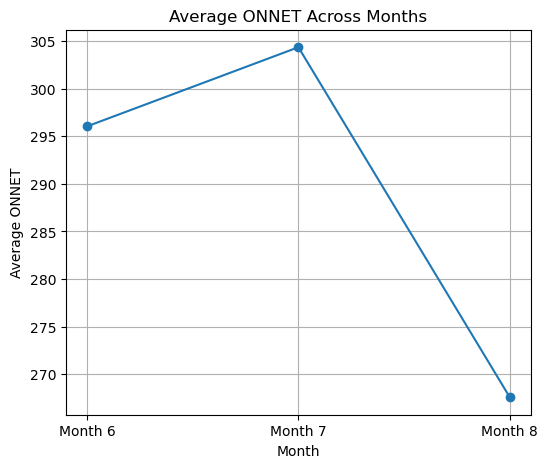

In [78]:
# For a high level view of ONNET change across months, we can calculate the mean ONNET per month and plot it
mean_onnet = hv_df[onnet_cols].mean()

plt.figure(figsize=(6,5))
plt.plot(['Month 6', 'Month 7', 'Month 8'], mean_onnet, marker='o')
plt.title('Average ONNET Across Months')
plt.xlabel('Month')
plt.ylabel('Average ONNET')
plt.grid(True)
plt.show()

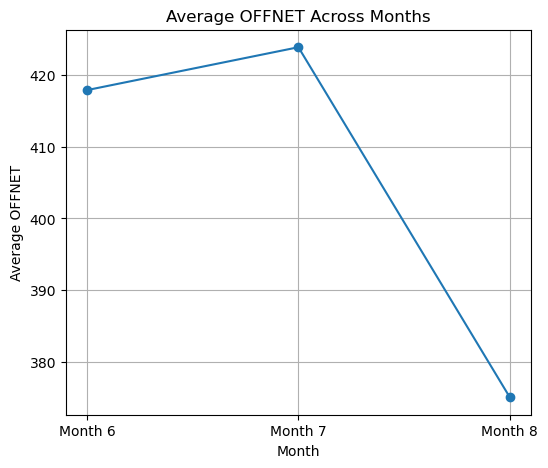

In [79]:
# For a high level view of OFFNET change across months, we can calculate the mean OFFNET per month and plot it
mean_offnet = hv_df[offnet_cols].mean()

plt.figure(figsize=(6,5))
plt.plot(['Month 6', 'Month 7', 'Month 8'], mean_offnet, marker='o')
plt.title('Average OFFNET Across Months')
plt.xlabel('Month')
plt.ylabel('Average OFFNET')
plt.grid(True)
plt.show()

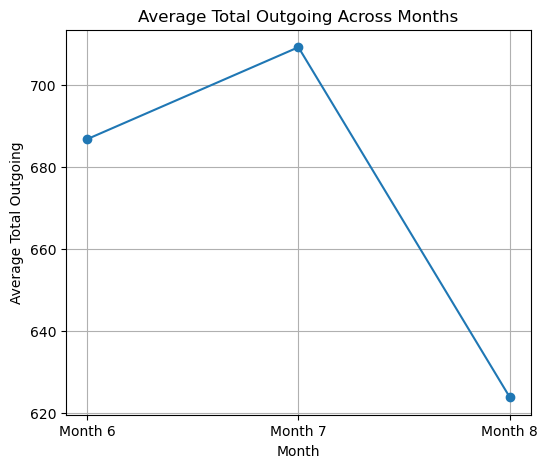

In [80]:
# For a high level view of 'total_og' change across months, we can calculate the mean 'total_og' per month and plot it
mean_total_og = hv_df[total_og_cols].mean()

plt.figure(figsize=(6,5))
plt.plot(['Month 6', 'Month 7', 'Month 8'], mean_total_og, marker='o')
plt.title('Average Total Outgoing Across Months')
plt.xlabel('Month')
plt.ylabel('Average Total Outgoing')
plt.grid(True)
plt.show()

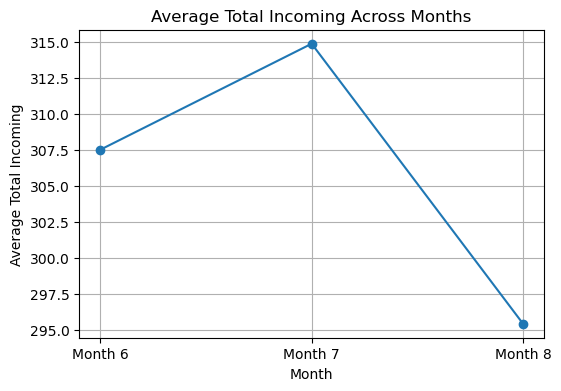

In [81]:
# For a high level view of 'total_ic' change across months, we can calculate the mean 'total_ic' per month and plot it
mean_total_ic = hv_df[total_ic_cols].mean()

plt.figure(figsize=(6,4))
plt.plot(['Month 6', 'Month 7', 'Month 8'], mean_total_ic, marker='o')
plt.title('Average Total Incoming Across Months')
plt.xlabel('Month')
plt.ylabel('Average Total Incoming')
plt.grid(True)
plt.show()

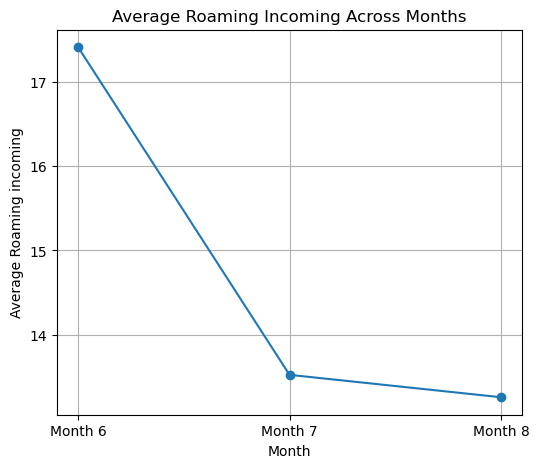

In [82]:
# For a high level view of 'roam_ic' change across months, we can calculate the mean 'roam_ic' per month and plot it
mean_roam_ic = hv_df[roam_ic_cols].mean()

plt.figure(figsize=(6,5))
plt.plot(['Month 6', 'Month 7', 'Month 8'], mean_roam_ic, marker='o')
plt.title('Average Roaming Incoming Across Months')
plt.xlabel('Month')
plt.ylabel('Average Roaming incoming')
plt.grid(True)
plt.show()

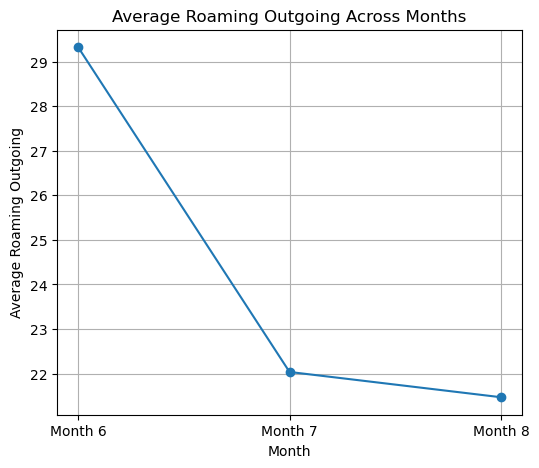

In [83]:
# For a high level view of 'roam_og' change across months, we can calculate the mean 'roam_og' per month and plot it
mean_roam_og = hv_df[roam_og_cols].mean()

plt.figure(figsize=(6,5))
plt.plot(['Month 6', 'Month 7', 'Month 8'], mean_roam_og, marker='o')
plt.title('Average Roaming Outgoing Across Months')
plt.xlabel('Month')
plt.ylabel('Average Roaming Outgoing')
plt.grid(True)
plt.show()

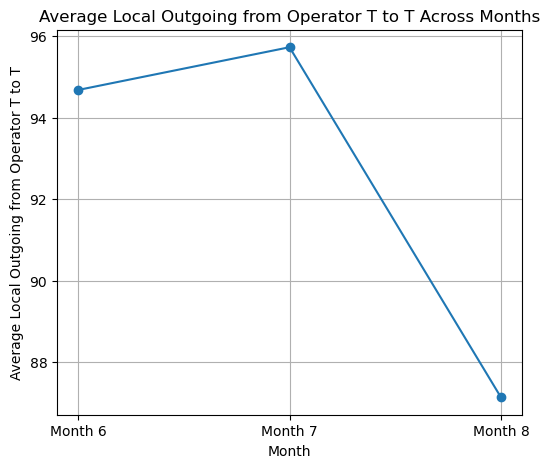

In [84]:
# For a high level view of 'loc_og_t2t' change across months, we can calculate the mean 'loc_og_t2t' per month and plot it
mean_loc_og_t2t = hv_df[loc_og_t2t_cols].mean()

plt.figure(figsize=(6,5))
plt.plot(['Month 6', 'Month 7', 'Month 8'], mean_loc_og_t2t, marker='o')
plt.title('Average Local Outgoing from Operator T to T Across Months')
plt.xlabel('Month')
plt.ylabel('Average Local Outgoing from Operator T to T')
plt.grid(True)
plt.show()

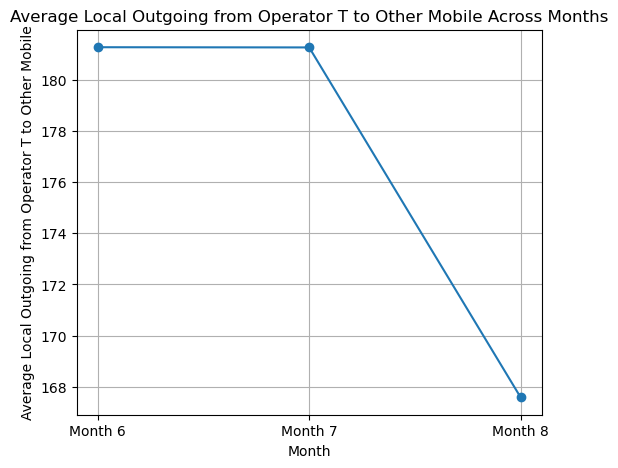

In [85]:
# For a high level view of 'loc_og_t2m' change across months, we can calculate the mean 'loc_og_t2m' per month and plot it
mean_loc_og_t2m = hv_df[loc_og_t2m_cols].mean()

plt.figure(figsize=(6,5))
plt.plot(['Month 6', 'Month 7', 'Month 8'], mean_loc_og_t2m, marker='o')
plt.title('Average Local Outgoing from Operator T to Other Mobile Across Months')
plt.xlabel('Month')
plt.ylabel('Average Local Outgoing from Operator T to Other Mobile')
plt.grid(True)
plt.show()

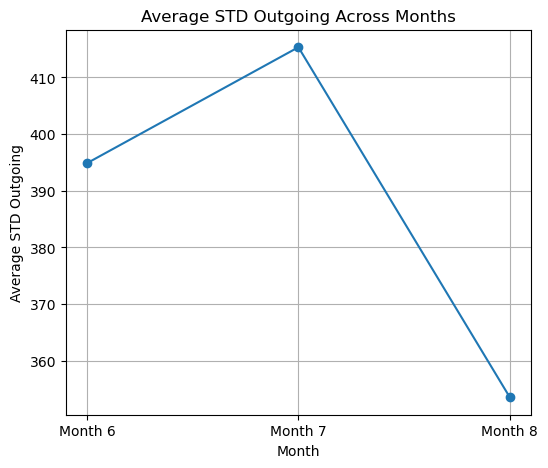

In [86]:
# For a high level view of 'STD_og' change across months, we can calculate the mean 'STD_og' per month and plot it
mean_std_og = hv_df[std_og_cols].mean()

plt.figure(figsize=(6,5))
plt.plot(['Month 6', 'Month 7', 'Month 8'], mean_std_og, marker='o')
plt.title('Average STD Outgoing Across Months')
plt.xlabel('Month')
plt.ylabel('Average STD Outgoing')
plt.grid(True)
plt.show()

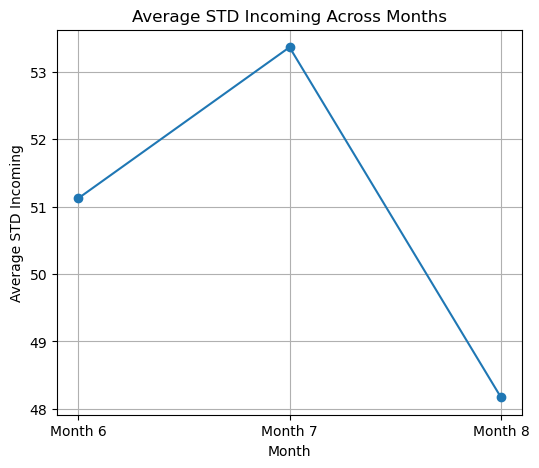

In [87]:
# For a high level view of 'STD_ic' change across months, we can calculate the mean 'STD_ic' per month and plot it
mean_std_ic = hv_df[std_ic_cols].mean()

plt.figure(figsize=(6,5))
plt.plot(['Month 6', 'Month 7', 'Month 8'], mean_std_ic, marker='o')
plt.title('Average STD Incoming Across Months')
plt.xlabel('Month')
plt.ylabel('Average STD Incoming')
plt.grid(True)
plt.show()

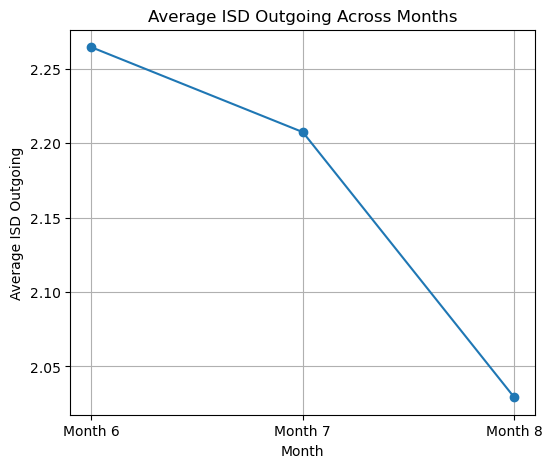

In [88]:
# For a high level view of 'ISD_og' change across months, we can calculate the mean 'ISD_og' per month and plot it
mean_isd_og = hv_df[isd_og_cols].mean()

plt.figure(figsize=(6,5))
plt.plot(['Month 6', 'Month 7', 'Month 8'], mean_isd_og, marker='o')
plt.title('Average ISD Outgoing Across Months')
plt.xlabel('Month')
plt.ylabel('Average ISD Outgoing')
plt.grid(True)
plt.show()

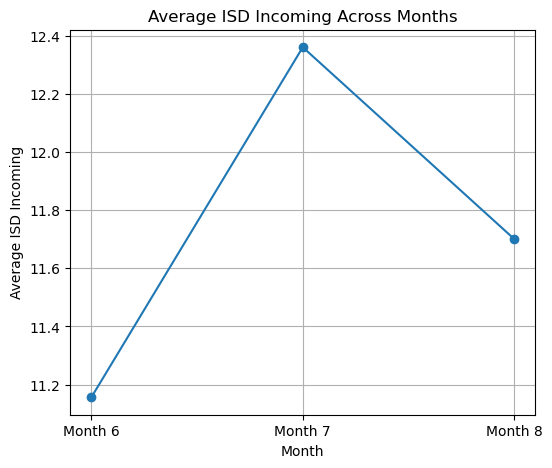

In [89]:
# For a high level view of 'ISD_ic' change across months, we can calculate the mean 'ISD_ic' per month and plot it
mean_isd_ic = hv_df[isd_ic_cols].mean()

plt.figure(figsize=(6,5))
plt.plot(['Month 6', 'Month 7', 'Month 8'], mean_isd_ic, marker='o')
plt.title('Average ISD Incoming Across Months')
plt.xlabel('Month')
plt.ylabel('Average ISD Incoming')
plt.grid(True)
plt.show()

### Checking the Churn Rate

In [91]:
churn_perc = (sum(hv_df['churn'])/len(hv_df['churn'].index))*100
churn_perc

8.64016527273333

## Splitting Data into Training and Test Sets

In [93]:
from sklearn.model_selection import train_test_split

# Putting feature variable to X
X = hv_df.drop(['churn','mobile_number'],axis=1)

# Putting response variable to y
y = hv_df['churn']

y.head()

7     1
8     0
13    0
16    0
17    0
Name: churn, dtype: int32

In [94]:
# Splitting the data into train and test
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.7, test_size=0.3, stratify = y, random_state=42)

## Scaling the data

In [96]:
from sklearn.preprocessing import StandardScaler

In [97]:
scaler = StandardScaler()

In [98]:
X_train.columns

Index(['arpu_6', 'arpu_7', 'arpu_8', 'onnet_mou_6', 'onnet_mou_7',
       'onnet_mou_8', 'offnet_mou_6', 'offnet_mou_7', 'offnet_mou_8',
       'roam_ic_mou_6',
       ...
       'monthly_3g_6', 'monthly_3g_7', 'monthly_3g_8', 'sachet_3g_6',
       'sachet_3g_7', 'sachet_3g_8', 'aon', 'vbc_3g_8', 'vbc_3g_7',
       'vbc_3g_6'],
      dtype='object', length=124)

In [99]:
X_train[X_train.columns] = scaler.fit_transform(X_train[X_train.columns])
X_train.head()

,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,vbc_3g_8,vbc_3g_7,vbc_3g_6
72509,2.075450,2.312226,0.070492,0.208795,-0.004717,0.084981,6.993310,6.321933,1.019977,-0.222743,-0.173713,-0.174663,-0.245317,-0.224144,-0.147341,-0.126548,-0.092473,0.056056,-0.326787,-0.000315,-0.620447,0.377791,0.103543,0.296939,1.354399,-0.191397,-0.141392,-0.271659,-0.055553,-0.349366,0.339100,0.072105,0.084879,8.228955,7.101364,1.548443,0.160897,-0.000113,-0.073497,5.817661,4.937531,1.104908,-0.045492,-0.045384,-0.042681,0.397767,-0.101671,0.274984,1.797362,-0.018188,-0.019183,5.193911,4.520060,0.807943,0.038529,-0.027556,0.071383,0.232094,-0.437959,-0.592296,-0.143580,-0.237297,-0.262838,0.164036,-0.356929,-0.418460,-0.196280,-0.205567,-0.219746,0.414824,0.005477,0.137636,-0.132734,-0.151210,0.041090,0.165123,-0.131842,0.007475,0.173269,-0.395074,-0.386740,-0.323146,-0.119672,2.017838,-0.158587,-0.150626,-0.148088,-0.045910,-0.093106,-0.007255,0.727799,0.528549,-0.237537,2.461500,1.947977,0.298819,-0.295191,-0.308515,-0.078336,0.105571,0.112292,-0.647660,-0.280179,-0.27502,-0.257645,-0.293098,-0.32297,-0.315711,-0.331393,-0.337477,-0.317131,-0.294932,-0.31123,-0.327749,-0.302062,-0.295036,-0.295994,-0.156988,-0.155469,-0.151613,-1.071260,-0.330049,-0.329144,-0.311532
64707,-0.501716,0.550864,0.327835,0.995497,1.593064,1.306646,-0.568853,2.033859,1.623126,-0.222743,-0.173713,-0.174663,-0.245317,-0.224144,-0.206668,-0.365319,-0.226214,-0.232280,-0.593022,-0.086020,-0.390692,-0.296021,-0.299552,-0.308619,1.122570,-0.191397,-0.224406,-0.640907,-0.225024,-0.417361,1.366654,1.974416,1.642497,-0.224147,2.379570,2.102806,-0.155523,-0.152393,-0.152401,0.764852,2.953922,2.506837,-0.045492,-0.045384,-0.042681,0.157997,-0.158813,1.164856,-0.297324,-0.018188,-0.019183,0.331400,2.592454,2.058308,0.680793,0.107789,-0.126343,-0.237406,-0.148828,-0.410988,-0.271958,-0.213123,-0.332949,0.132688,-0.080769,-0.401415,0.004710,-0.075732,0.262441,-0.069704,-0.120108,0.387581,-0.124032,-0.151210,-0.130536,-0.064209,-0.151058,0.403984,0.064106,-0.161043,-0.216872,3.599253,-0.119672,2.017838,-0.153488,-0.149054,-0.136885,0.067450,0.014040,0.037722,-0.432783,-0.306108,-0.025888,-0.470267,0.516613,0.428599,-0.020457,0.296872,0.653468,0.035720,0.905834,0.326808,-0.280179,-0.27502,-0.257645,-0.293098,-0.322

In [100]:
X_train.shape

(21007, 124)

### Handling Class Imbalance

Text(0.5, 1.0, 'Class Distributions \n (0: No Churn || 1: Churn)')

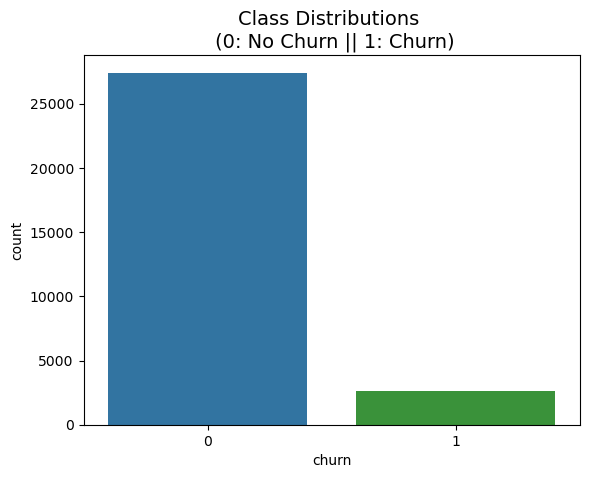

In [102]:
colors = ['tab:blue', 'tab:green']

sns.countplot(x='churn', data=hv_df, palette=colors, legend=False)
plt.title('Class Distributions \n (0: No Churn || 1: Churn)', fontsize=14)

In [103]:
print(hv_df.churn.value_counts())
hv_df.churn.value_counts(normalize = True).reset_index()

churn
0    27418
1     2593
Name: count, dtype: int64


,churn,proportion
0,0,0.913598
1,1,0.086402


#### **We can see that around 91.4% of the observations are mapped to 0 and churn cases (1) are only 8.6%. Therefore this is highly imbalanced.**

In [105]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import precision_score, recall_score, confusion_matrix, classification_report, accuracy_score, f1_score

from collections import Counter

### Applying Random Undersampling

In [107]:
# Random Undersampling
from imblearn.under_sampling import RandomUnderSampler
under_sample = RandomUnderSampler(random_state = 5)
X_resampled_us, y_resampled_us = under_sample.fit_resample(X_train, y_train)
len(X_resampled_us)

3630

In [108]:
print(sorted(Counter(y_resampled_us).items()))

[(0, 1815), (1, 1815)]


In [109]:
lreg_us = LogisticRegression()
lreg_us.fit(X_resampled_us, y_resampled_us)

y_pred_us = lreg_us.predict(X_test)

In [110]:
print ('Accuracy: ', accuracy_score(y_test, y_pred_us))
print ('F1 score: ', f1_score(y_test, y_pred_us))
print ('Recall: ', recall_score(y_test, y_pred_us))
print ('Precision: ', precision_score(y_test, y_pred_us))
print ('\n classification report:\n', classification_report(y_test,y_pred_us))
print ('\n confusion matrix:\n',confusion_matrix(y_test, y_pred_us))

Accuracy:  0.8811639271434918
F1 score:  0.4697720515361744
Recall:  0.609254498714653
Precision:  0.38225806451612904

 classification report:
               precision    recall  f1-score   support

           0       0.96      0.91      0.93      8226
           1       0.38      0.61      0.47       778

    accuracy                           0.88      9004
   macro avg       0.67      0.76      0.70      9004
weighted avg       0.91      0.88      0.89      9004


 confusion matrix:
 [[7460  766]
 [ 304  474]]


In this problem we will use **recall as evaluation metric** because we would like to capture the performance where we will be **rightly predicting positive classes** as the positive class is in a minority. So, the true test is whether or not the model is able to capture these actual positive cases correctly, which are quite few.

<html><mark><b>With Random Undersampling and Logistic Regression method, the recall is 0.61 for the positive class.</b></mark></html>

### Applying Tomek Links

In [114]:
# Tomek Links
from imblearn.under_sampling import TomekLinks
tomek_sample = TomekLinks(sampling_strategy='majority')
X_resampled_tomek, y_resampled_tomek = tomek_sample.fit_resample(X_train, y_train)
len(X_resampled_tomek)

20764

In [115]:
print(sorted(Counter(y_resampled_tomek).items()))

[(0, 18949), (1, 1815)]


In [116]:
lreg_tomek = LogisticRegression()
lreg_tomek.fit(X_resampled_tomek, y_resampled_tomek)

y_pred_tomek = lreg_tomek.predict(X_test)

In [117]:
print ('Accuracy: ', accuracy_score(y_test, y_pred_tomek))
print ('F1 score: ', f1_score(y_test, y_pred_tomek))
print ('Recall: ', recall_score(y_test, y_pred_tomek))
print ('Precision: ', precision_score(y_test, y_pred_tomek))
print ('\n classification report:\n', classification_report(y_test,y_pred_tomek))
print ('\n confusion matrix:\n',confusion_matrix(y_test, y_pred_tomek))

Accuracy:  0.9183696135051088
F1 score:  0.5116279069767442
Recall:  0.4948586118251928
Precision:  0.5295735900962861

 classification report:
               precision    recall  f1-score   support

           0       0.95      0.96      0.96      8226
           1       0.53      0.49      0.51       778

    accuracy                           0.92      9004
   macro avg       0.74      0.73      0.73      9004
weighted avg       0.92      0.92      0.92      9004


 confusion matrix:
 [[7884  342]
 [ 393  385]]


<html><mark><b>With Tomek Links and Logistic Regression method, the recall is 0.49 for the positive class, which is average.</b></mark></html>

### Applying Random Over-Sampling

In [120]:
# Random OverSampling
from imblearn.over_sampling import RandomOverSampler
over_sample = RandomOverSampler(sampling_strategy = 1)
X_resampled_os, y_resampled_os = over_sample.fit_resample(X_train, y_train)
len(X_resampled_os)

38384

In [121]:
print(sorted(Counter(y_resampled_os).items()))

[(0, 19192), (1, 19192)]


In [122]:
lreg_os = LogisticRegression()
lreg_os.fit(X_resampled_os, y_resampled_os)

y_pred_os = lreg_os.predict(X_test)

In [123]:
print ('Accuracy: ', accuracy_score(y_test, y_pred_os))
print ('F1 score: ', f1_score(y_test, y_pred_os))
print ('Recall: ', recall_score(y_test, y_pred_os))
print ('Precision: ', precision_score(y_test, y_pred_os))
print ('\n classification report:\n', classification_report(y_test,y_pred_os))
print ('\n confusion matrix:\n',confusion_matrix(y_test, y_pred_os))

Accuracy:  0.9063749444691248
F1 score:  0.5146804835924007
Recall:  0.5745501285347043
Precision:  0.46611053180396245

 classification report:
               precision    recall  f1-score   support

           0       0.96      0.94      0.95      8226
           1       0.47      0.57      0.51       778

    accuracy                           0.91      9004
   macro avg       0.71      0.76      0.73      9004
weighted avg       0.92      0.91      0.91      9004


 confusion matrix:
 [[7714  512]
 [ 331  447]]


<html><mark><b>With Random Oversampling and Logistic Regression method, the recall is 0.58 for the positive class, which is comparable to undersampling model values.</b></mark></html>

### Applying SMOTE

In [126]:
# SMOTE
from imblearn.over_sampling import SMOTE
smt = SMOTE(random_state=45, k_neighbors=5)
X_resampled_smt, y_resampled_smt = smt.fit_resample(X_train, y_train)
len(X_resampled_smt)

38384

In [127]:
print(sorted(Counter(y_resampled_smt).items()))

[(0, 19192), (1, 19192)]


In [128]:
lreg_smt = LogisticRegression()
lreg_smt.fit(X_resampled_smt, y_resampled_smt)

y_pred_smt = lreg_smt.predict(X_test)

In [129]:
print ('Accuracy: ', accuracy_score(y_test, y_pred_smt))
print ('F1 score: ', f1_score(y_test, y_pred_smt))
print ('Recall: ', recall_score(y_test, y_pred_smt))
print ('Precision: ', precision_score(y_test, y_pred_smt))
print ('\n classification report:\n', classification_report(y_test,y_pred_smt))
print ('\n confusion matrix:\n',confusion_matrix(y_test, y_pred_smt))

Accuracy:  0.9128165259884495
F1 score:  0.48116325181758096
Recall:  0.46786632390745503
Precision:  0.49523809523809526

 classification report:
               precision    recall  f1-score   support

           0       0.95      0.95      0.95      8226
           1       0.50      0.47      0.48       778

    accuracy                           0.91      9004
   macro avg       0.72      0.71      0.72      9004
weighted avg       0.91      0.91      0.91      9004


 confusion matrix:
 [[7855  371]
 [ 414  364]]


<html><mark><b>With SMOTE and Logistic Regression method, the recall is 0.47 for the positive class, which is lower than the previous model values.</b></mark></html>

### Applying ADASYN

In [132]:
# ADASYN
from imblearn.over_sampling import ADASYN
ada = ADASYN(random_state=45, n_neighbors=5)
X_resampled_ada, y_resampled_ada = ada.fit_resample(X_train, y_train)
len(X_resampled_ada)

38962

In [133]:
print(sorted(Counter(y_resampled_ada).items()))

[(0, 19192), (1, 19770)]


In [134]:
lreg_ada = LogisticRegression()
lreg_ada.fit(X_resampled_ada, y_resampled_ada)

y_pred_ada = lreg_ada.predict(X_test)

In [135]:
print ('Accuracy: ', accuracy_score(y_test, y_pred_ada))
print ('F1 score: ', f1_score(y_test, y_pred_ada))
print ('Recall: ', recall_score(y_test, y_pred_ada))
print ('Precision: ', precision_score(y_test, y_pred_ada))
print ('\n classification report:\n', classification_report(y_test,y_pred_ada))
print ('\n confusion matrix:\n',confusion_matrix(y_test, y_pred_ada))

Accuracy:  0.9104842292314527
F1 score:  0.48267008985879334
Recall:  0.4832904884318766
Precision:  0.48205128205128206

 classification report:
               precision    recall  f1-score   support

           0       0.95      0.95      0.95      8226
           1       0.48      0.48      0.48       778

    accuracy                           0.91      9004
   macro avg       0.72      0.72      0.72      9004
weighted avg       0.91      0.91      0.91      9004


 confusion matrix:
 [[7822  404]
 [ 402  376]]


<html><mark><b>With ADASYN and Logistic Regression method, the recall is 0.48 for the positive class, which is lower than the previous model values.</b></mark></html>

### Applying SMOTE+TOMEK

In [138]:
# SMOTE+TOMEK
from imblearn.combine import SMOTETomek
smt_tmk = SMOTETomek(random_state=45)
X_resampled_smt_tmk, y_resampled_smt_tmk = smt_tmk.fit_resample(X_train, y_train)
len(X_resampled_smt_tmk)

38374

In [139]:
print(sorted(Counter(y_resampled_smt_tmk).items()))

[(0, 19187), (1, 19187)]


In [140]:
lreg_smt_tmk = LogisticRegression()
lreg_smt_tmk.fit(X_resampled_smt_tmk, y_resampled_smt_tmk)

y_pred_smt_tmk = lreg_smt_tmk.predict(X_test)

In [141]:
print ('Accuracy: ', accuracy_score(y_test, y_pred_smt_tmk))
print ('F1 score: ', f1_score(y_test, y_pred_smt_tmk))
print ('Recall: ', recall_score(y_test, y_pred_smt_tmk))
print ('Precision: ', precision_score(y_test, y_pred_smt_tmk))
print ('\n classification report:\n', classification_report(y_test,y_pred_smt_tmk))
print ('\n confusion matrix:\n',confusion_matrix(y_test, y_pred_smt_tmk))

Accuracy:  0.913038649489116
F1 score:  0.48248512888301387
Recall:  0.4691516709511568
Precision:  0.4965986394557823

 classification report:
               precision    recall  f1-score   support

           0       0.95      0.96      0.95      8226
           1       0.50      0.47      0.48       778

    accuracy                           0.91      9004
   macro avg       0.72      0.71      0.72      9004
weighted avg       0.91      0.91      0.91      9004


 confusion matrix:
 [[7856  370]
 [ 413  365]]


<html><mark><b>With SMOTE+TOMEK and Logistic Regression method, the recall is 0.47 for the positive class, which is also low.</b></mark></html>

In [143]:
# Summarizing all recall values from class imbalance + logistic regression models
random_us_report = classification_report(y_test,y_pred_us, output_dict=True)
print ('Recall for Random Undersampling:', random_us_report['1']['recall'])
tomek_report = classification_report(y_test,y_pred_tomek, output_dict=True)
print ('Recall for TOMEK:', tomek_report['1']['recall'])
random_os_report = classification_report(y_test,y_pred_os, output_dict=True)
print ('Recall for Random Oversampling:', random_os_report['1']['recall'])
SMOTE_report = classification_report(y_test,y_pred_smt, output_dict=True)
print ('Recall for SMOTE:', SMOTE_report['1']['recall'])
ADASYN_report = classification_report(y_test,y_pred_ada, output_dict=True)
print ('Recall for ADASYN:', ADASYN_report['1']['recall'])
SMOTE_TOMEK_report = classification_report(y_test,y_pred_smt_tmk, output_dict=True)
print ('Recall for SMOTE+TOMEK:', SMOTE_TOMEK_report['1']['recall'])

Recall for Random Undersampling: 0.609254498714653
Recall for TOMEK: 0.4948586118251928
Recall for Random Oversampling: 0.5745501285347043
Recall for SMOTE: 0.46786632390745503
Recall for ADASYN: 0.4832904884318766
Recall for SMOTE+TOMEK: 0.4691516709511568


<html><mark><b>As the recall value for the Undersampling model is the highest, using the sample balanced with Undersampling to use with PCA</b></mark></html> 

### Applying PCA on the data

In [146]:
from sklearn.decomposition import PCA

In [147]:
pca = PCA(random_state=42)

In [148]:
pca.fit(X_resampled_us)

PCA(random_state=42)

In [149]:
# Give principal components 
pca.components_

array([[ 1.34607035e-01,  1.52435295e-01,  1.25284763e-01, ...,
        -7.76034966e-04, -8.56699965e-03, -1.73049086e-02],
       [-1.16729309e-02,  1.85571243e-02,  5.78814122e-02, ...,
         4.78720380e-02,  5.65042935e-02,  5.75638549e-02],
       [ 6.27052185e-02,  7.41695037e-02,  7.12347655e-02, ...,
         2.64687428e-02,  2.91041432e-02,  3.46677690e-02],
       ...,
       [ 1.80703539e-08,  7.67459709e-07,  3.57936368e-07, ...,
         1.72309443e-07,  1.40629256e-07,  2.02780574e-08],
       [-1.97170707e-07,  6.91385801e-07,  4.73709468e-07, ...,
        -1.55077580e-07,  3.21118582e-07,  3.06549858e-09],
       [-6.24563597e-09, -5.95121658e-08, -1.02383900e-07, ...,
         3.55463320e-08, -1.82729658e-07,  1.26015766e-07]])

In [150]:
# Calculate how much variance is being explained by each Principal Component
pca.explained_variance_ratio_

array([9.08238284e-02, 8.19198597e-02, 6.77040483e-02, 6.60486361e-02,
       6.20562878e-02, 5.86616435e-02, 3.96974354e-02, 3.80861927e-02,
       3.23282514e-02, 2.82287416e-02, 2.33810012e-02, 1.95151727e-02,
       1.82732508e-02, 1.71881214e-02, 1.65502306e-02, 1.62918283e-02,
       1.52296794e-02, 1.48960993e-02, 1.33368045e-02, 1.24957140e-02,
       1.14483568e-02, 1.05698824e-02, 1.04243667e-02, 9.81059431e-03,
       9.49550967e-03, 8.86745256e-03, 8.54055552e-03, 7.93668751e-03,
       7.46278485e-03, 7.11702258e-03, 6.90884544e-03, 6.51718194e-03,
       6.30580074e-03, 6.19580672e-03, 5.94798633e-03, 5.52571563e-03,
       5.45535949e-03, 5.39354493e-03, 5.32705820e-03, 5.21478601e-03,
       4.77639616e-03, 4.50831194e-03, 4.35121815e-03, 4.28284381e-03,
       4.16611254e-03, 3.91466005e-03, 3.84515448e-03, 3.74297967e-03,
       3.57416946e-03, 3.44189835e-03, 3.38779652e-03, 3.35806975e-03,
       3.18717314e-03, 3.08887457e-03, 3.01679605e-03, 2.75720377e-03,
      

<BarContainer object of 124 artists>

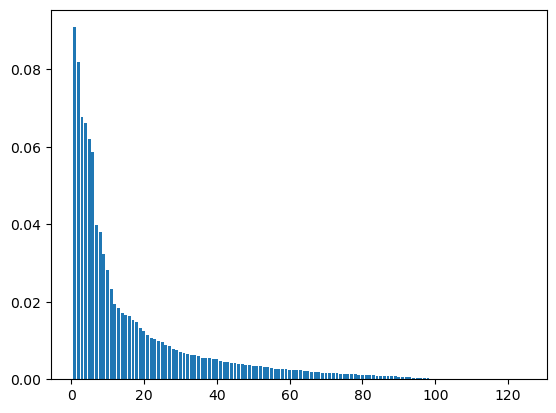

In [151]:
plt.bar(range(1,len(pca.explained_variance_ratio_)+1), pca.explained_variance_ratio_)

In [152]:
var_cumu = np.cumsum(pca.explained_variance_ratio_)

### Making the scree plot

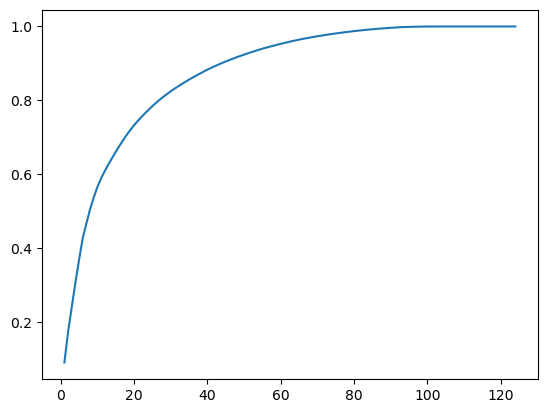

In [154]:
# Plotting number of components on the X-axis and the total variance explained on the Y-axis
plt.plot(range(1,len(var_cumu)+1), var_cumu)

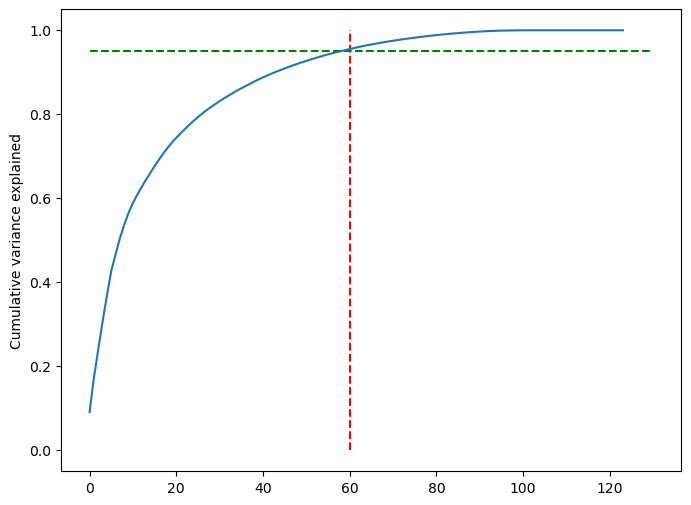

In [155]:
fig = plt.figure(figsize=[8,6])
plt.vlines(x=60, ymax=1, ymin=0, colors="r", linestyles="--")
plt.hlines(y=0.95, xmax=130, xmin=0, colors="g", linestyles="--")
plt.plot(var_cumu)
plt.ylabel("Cumulative variance explained")
plt.show()

**Perform PCA with 60 components**

In [157]:
from sklearn.decomposition import IncrementalPCA

In [158]:
pca_final = IncrementalPCA(n_components=60)

In [159]:
df_train_pca = pca_final.fit_transform(X_resampled_us)

In [160]:
df_train_pca.shape

(3630, 60)

In [161]:
corrmat = np.corrcoef(df_train_pca.transpose())

In [162]:
corrmat.shape

(60, 60)

<Axes: >

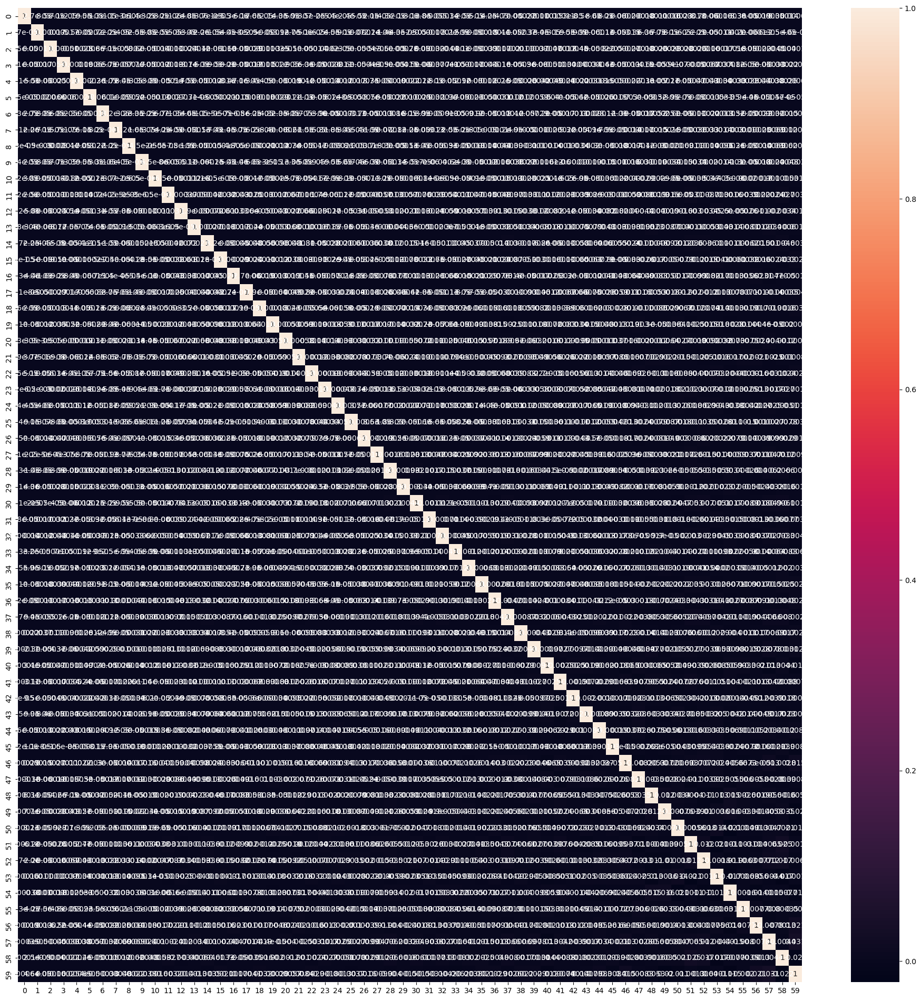

In [163]:
# Plotting the heatmap of the corr matrix
plt.figure(figsize=[24,24])
sns.heatmap(corrmat, annot=True)

**Correlation matrix shows that there is no correlation between the 60 variables included in the model now**

In [165]:
# Applying the transformation on the test set
df_test_pca = pca_final.transform(X_test)
df_test_pca.shape

(9004, 60)

### Applying logistic regression on the data on our Principal components

In [167]:
from sklearn.linear_model import LogisticRegression

In [168]:
learner_pca = LogisticRegression()

In [169]:
model_pca = learner_pca.fit(df_train_pca, y_resampled_us)

**Making predictions on the test set**

In [171]:
from sklearn import metrics
pred_probs_test = model_pca.predict_proba(df_test_pca)

In [172]:
"{:2.2}".format(metrics.roc_auc_score(y_test, pred_probs_test[:,1]))

'0.85'

### Making the model by only selecting the amount of variance to include in the data, not components

In [174]:
pca_again = PCA(0.9)

In [175]:
df_train_pca2 = pca_again.fit_transform(X_resampled_us)

In [176]:
df_train_pca2.shape

(3630, 44)

**Following it up with a logistic regression model**

In [178]:
learner_pca2 = LogisticRegression()

In [179]:
model_pca2 = learner_pca2.fit(df_train_pca2, y_resampled_us)

In [180]:
df_test_pca2 = pca_again.transform(X_test)

In [181]:
df_test_pca2.shape

(9004, 44)

In [182]:
pred_probs_test2 = model_pca2.predict_proba(df_test_pca2)[:,1]

In [183]:
"{:2.2}".format(metrics.roc_auc_score(y_test, pred_probs_test2))

'0.85'

## Making another model to identify important predictor attributes which are indicators of churn

### Beginning with Logistic Regression

In [186]:
from sklearn.linear_model import LogisticRegression

logreg = LogisticRegression(random_state=42)
logreg.fit(X_resampled_us, y_resampled_us)

LogisticRegression(random_state=42)

In [187]:
y_train_pred = logreg.predict(X_resampled_us)

In [188]:
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

accuracy_score(y_resampled_us, y_train_pred)

0.8363636363636363

In [189]:
confusion_matrix(y_resampled_us, y_train_pred)

array([[1499,  316],
       [ 278, 1537]], dtype=int64)

In [190]:
print(classification_report(y_resampled_us, y_train_pred))

              precision    recall  f1-score   support

           0       0.84      0.83      0.83      1815
           1       0.83      0.85      0.84      1815

    accuracy                           0.84      3630
   macro avg       0.84      0.84      0.84      3630
weighted avg       0.84      0.84      0.84      3630



**Performance on test set**

In [192]:
y_test_pred = logreg.predict(X_test)

In [193]:
accuracy_score(y_test, y_test_pred)

0.8811639271434918

 - So the **testset accuracy** seems to be similar to **trainset accuracy**, which means that the base model is not overfitting and with all features included, without any feature engineering and hyperparameter tuning, this is the baseline performance we can expect. 

### Using RandomForest

In [196]:
from sklearn.ensemble import RandomForestClassifier

rf = RandomForestClassifier(random_state=42, n_estimators=50, oob_score=True)
rf.fit(X_resampled_us, y_resampled_us)

RandomForestClassifier(n_estimators=50, oob_score=True, random_state=42)

**Performance on the train set**

In [198]:
y_train_pred = rf.predict(X_resampled_us)

In [199]:
accuracy_score(y_resampled_us, y_train_pred)

0.9997245179063361

**Performance on test set**

In [201]:
y_test_pred = rf.predict(X_test)

In [202]:
accuracy_score(y_test, y_test_pred)

0.8482896490448689

<html><mark><b>Difference in train and test accuracy indicates overfitting as test accuracy has reduced from train set accuracy. Also the test set accuracy is not any better than base model</b></mark></html>

## Model evaluation: Cross validation

In [205]:
from sklearn.model_selection import cross_val_score

In [206]:
# Cross Validating logistic model
cross_val_score(logreg, X_resampled_us, y_resampled_us, cv=5, n_jobs=-1)

array([0.80716253, 0.83057851, 0.82369146, 0.80165289, 0.82506887])

In [207]:
# Taking mean of logistic cv scores
cross_val_score(logreg, X_resampled_us, y_resampled_us, cv=5, n_jobs=-1).mean()

0.8176308539944903

In [208]:
# Cross Validating Random forest model
cross_val_score(rf, X_resampled_us, y_resampled_us, cv=5, n_jobs=-1)

array([0.815427  , 0.83608815, 0.85399449, 0.84297521, 0.87052342])

In [209]:
# Taking mean of random forest cv scores
cross_val_score(rf, X_resampled_us, y_resampled_us, cv=5, n_jobs=-1).mean()

0.8438016528925619

<html><mark><b>Check of logistic regression and Random forest model with cross validation score shows that Random forest model was slightly better than Logistic regression model and the performance of the Random forest model on the earlier train data was actually misleading with the real performance being similar to test data.</b></mark></html>

In [211]:
# Checking the inbuilt oob score for Random Forest as it is similar to CV score
rf.oob_score_

0.8404958677685951

## Using other evaluation methods besides accuracy

In [213]:
import sklearn
from sklearn.metrics._scorer import _SCORERS

In [214]:
# using recall
cross_val_score(rf, X_resampled_us, y_resampled_us, cv=5, n_jobs=-1, scoring="recall").mean()

0.8071625344352619

In [215]:
# using roc_auc
cross_val_score(rf, X_resampled_us, y_resampled_us, cv=5, n_jobs=-1, scoring="roc_auc").mean()

0.9127852529805948

## Feature Selection using Cross-Validation

In [217]:
# Checking number of total features selected in last model
X_resampled_us.shape

(3630, 124)

### Recursive Feature Elimination - RFE

In [219]:
from sklearn.feature_selection import RFE

In [220]:
logreg = LogisticRegression(random_state=42)

In [221]:
rfe = RFE(estimator=logreg, n_features_to_select=40)

In [222]:
rfe.fit(X_resampled_us, y_resampled_us)

RFE(estimator=LogisticRegression(random_state=42), n_features_to_select=40)

In [223]:
rfe.ranking_

array([ 1,  1, 13, 28,  1,  1,  1,  9, 18, 30, 83, 46, 68,  6, 19, 23,  5,
        1,  1, 39,  1, 31, 20,  1, 11, 10, 14, 77,  2,  1, 29,  1,  1,  1,
        1, 17, 73, 69, 80, 84, 34, 47, 12,  3, 63, 35, 81,  1, 61, 22, 21,
       85, 60,  1, 38,  1, 26, 78,  1,  1, 70, 32, 58, 55,  1, 25, 24,  1,
        1, 79, 52,  1, 33, 53, 64, 51, 50,  1,  1, 49,  1, 76,  1,  1, 54,
       16, 65, 15,  1,  1, 56,  1,  1,  1,  1, 48, 75,  1, 66, 72, 67,  1,
       59, 27,  8, 37, 43, 62, 74, 82,  1,  7, 57,  1, 41,  4,  1, 42, 44,
       45,  1, 71, 40, 36])

In [224]:
X_resampled_us.columns[rfe.support_]

Index(['arpu_6', 'arpu_7', 'onnet_mou_7', 'onnet_mou_8', 'offnet_mou_6',
       'loc_og_t2t_mou_8', 'loc_og_t2m_mou_6', 'loc_og_t2m_mou_8',
       'loc_og_t2f_mou_8', 'loc_og_mou_8', 'std_og_t2t_mou_7',
       'std_og_t2t_mou_8', 'std_og_t2m_mou_6', 'std_og_t2m_mou_7',
       'spl_og_mou_8', 'total_og_mou_8', 'loc_ic_t2t_mou_7',
       'loc_ic_t2m_mou_7', 'loc_ic_t2m_mou_8', 'loc_ic_mou_7',
       'std_ic_t2t_mou_7', 'std_ic_t2t_mou_8', 'std_ic_t2m_mou_8',
       'std_ic_mou_8', 'total_ic_mou_6', 'total_ic_mou_8', 'spl_ic_mou_7',
       'spl_ic_mou_8', 'ic_others_7', 'ic_others_8', 'total_rech_num_7',
       'total_rech_num_8', 'total_rech_amt_6', 'total_rech_amt_7',
       'max_rech_amt_7', 'last_day_rch_amt_8', 'monthly_2g_8', 'sachet_2g_8',
       'monthly_3g_8', 'aon'],
      dtype='object')

In [225]:
X_train2 = X_resampled_us.loc[:,rfe.support_]
X_train2.shape

(3630, 40)

In [226]:
X_train2.columns

Index(['arpu_6', 'arpu_7', 'onnet_mou_7', 'onnet_mou_8', 'offnet_mou_6',
       'loc_og_t2t_mou_8', 'loc_og_t2m_mou_6', 'loc_og_t2m_mou_8',
       'loc_og_t2f_mou_8', 'loc_og_mou_8', 'std_og_t2t_mou_7',
       'std_og_t2t_mou_8', 'std_og_t2m_mou_6', 'std_og_t2m_mou_7',
       'spl_og_mou_8', 'total_og_mou_8', 'loc_ic_t2t_mou_7',
       'loc_ic_t2m_mou_7', 'loc_ic_t2m_mou_8', 'loc_ic_mou_7',
       'std_ic_t2t_mou_7', 'std_ic_t2t_mou_8', 'std_ic_t2m_mou_8',
       'std_ic_mou_8', 'total_ic_mou_6', 'total_ic_mou_8', 'spl_ic_mou_7',
       'spl_ic_mou_8', 'ic_others_7', 'ic_others_8', 'total_rech_num_7',
       'total_rech_num_8', 'total_rech_amt_6', 'total_rech_amt_7',
       'max_rech_amt_7', 'last_day_rch_amt_8', 'monthly_2g_8', 'sachet_2g_8',
       'monthly_3g_8', 'aon'],
      dtype='object')

**Evaluation using cross val score**

In [228]:
cross_val_score(logreg, X_train2, y_resampled_us, n_jobs=-1).mean()

0.8289256198347108

<html><mark><b>Here the cross validation score seems to have decreased from the base model that we built earlier where it was approximately 84% for the logistic regression model. Here the score seems to be about 83% with 40 features selected. Have we chosen the right number of features?</b></mark></html>

### Cross validation for feature selection using RFECV

In [231]:
num_features = X_resampled_us.shape
num_features[1]

124

In [232]:
cv_scores = []

In [233]:
logreg = LogisticRegression(random_state=42)

In [234]:
from sklearn.feature_selection import RFECV

In [235]:
rfecv = RFECV(estimator=logreg, cv=4)

In [236]:
%%time
rfecv.fit(X_resampled_us, y_resampled_us)

CPU times: total: 2min 26s
Wall time: 38.3 s


RFECV(cv=4, estimator=LogisticRegression(random_state=42))

In [237]:
rfecv.cv_results_['mean_test_score']

array([0.74132785, 0.74463273, 0.74931456, 0.75950634, 0.76529222,
       0.77328257, 0.78044237, 0.7779641 , 0.78347253, 0.78953465,
       0.78705486, 0.79036277, 0.79393963, 0.79945262, 0.8019315 ,
       0.8085452 , 0.81129881, 0.81074632, 0.81350236, 0.81763171,
       0.81708105, 0.81570349, 0.8168042 , 0.82341608, 0.82561872,
       0.82369141, 0.82424207, 0.8245174 , 0.824518  , 0.82589587,
       0.8253446 , 0.82617151, 0.82534551, 0.82451922, 0.82672399,
       0.82396765, 0.82424267, 0.82231354, 0.82286481, 0.82258857,
       0.82258887, 0.82424267, 0.82066156, 0.8209375 , 0.82066277,
       0.8209381 , 0.82038744, 0.82203942, 0.82176318, 0.82286693,
       0.8225913 , 0.82204033, 0.82231415, 0.8217647 , 0.8217647 ,
       0.82148907, 0.82231536, 0.8217647 , 0.82204033, 0.82148876,
       0.82203973, 0.82369262, 0.82148907, 0.82066247, 0.81983587,
       0.81983617, 0.82148937, 0.82369262, 0.82259039, 0.82396886,
       0.822591  , 0.82258978, 0.82203912, 0.8201109 , 0.82038

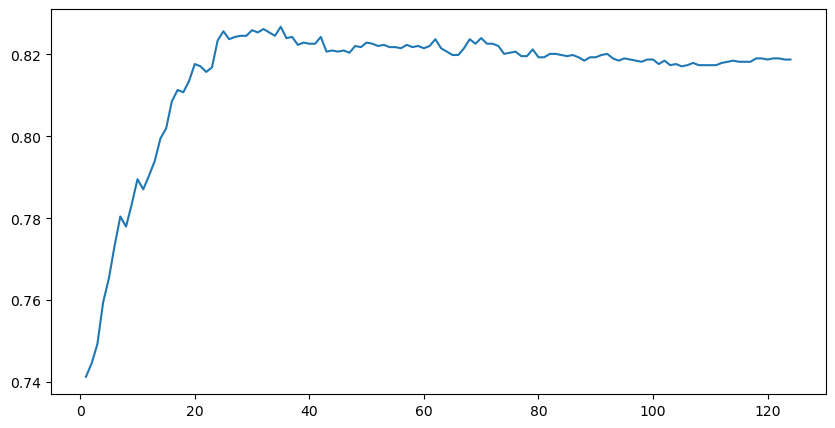

In [238]:
plt.figure(figsize=[10, 5])
plt.plot(range(1, num_features[1]+1), rfecv.cv_results_['mean_test_score'])
plt.show()

In [239]:
# No. of optimum features suggested by the RFECV 
rfecv.n_features_

35

In [240]:
rfe = RFE(estimator=logreg, n_features_to_select=35)

In [241]:
rfe.fit(X_resampled_us, y_resampled_us)

RFE(estimator=LogisticRegression(random_state=42), n_features_to_select=35)

In [242]:
X_train3 = X_resampled_us.loc[:,rfe.support_]
X_train3.shape

(3630, 35)

In [243]:
X_train3.columns

Index(['arpu_7', 'onnet_mou_7', 'onnet_mou_8', 'offnet_mou_6',
       'loc_og_t2t_mou_8', 'loc_og_t2m_mou_6', 'loc_og_t2m_mou_8',
       'loc_og_t2f_mou_8', 'loc_og_mou_8', 'std_og_t2t_mou_7',
       'std_og_t2t_mou_8', 'std_og_t2m_mou_6', 'std_og_t2m_mou_7',
       'total_og_mou_8', 'loc_ic_t2t_mou_7', 'loc_ic_t2m_mou_7',
       'loc_ic_t2m_mou_8', 'loc_ic_mou_7', 'std_ic_t2t_mou_7',
       'std_ic_t2t_mou_8', 'std_ic_t2m_mou_8', 'std_ic_mou_8',
       'total_ic_mou_6', 'total_ic_mou_8', 'spl_ic_mou_8', 'ic_others_7',
       'ic_others_8', 'total_rech_num_7', 'total_rech_num_8',
       'total_rech_amt_6', 'last_day_rch_amt_8', 'monthly_2g_8', 'sachet_2g_8',
       'monthly_3g_8', 'aon'],
      dtype='object')

In [244]:
# Evaluating the model with 35 features using CV score
cross_val_score(logreg, X_train3, y_resampled_us, n_jobs=-1).mean()

0.8264462809917357

## Hyperparameter Tuning using Randomized Search CV

In [246]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import RandomizedSearchCV

In [247]:
rf = RandomForestClassifier(random_state=42, n_jobs=-1)

In [248]:
hyper_params = {'max_depth': range(3, 20),
                'max_features': range(3, 35),
                'min_samples_leaf': range(2, 100, 2),
                'n_estimators': range(10, 200, 5)}

In [249]:
model_rcv = RandomizedSearchCV(estimator=rf, 
                              param_distributions=hyper_params,
                              verbose=1,
                              cv=5,
                              return_train_score=True,
                              n_jobs=-1,
                              n_iter=50)

In [250]:
model_rcv.fit(X_resampled_us, y_resampled_us)

Fitting 5 folds for each of 50 candidates, totalling 250 fits


RandomizedSearchCV(cv=5,
                   estimator=RandomForestClassifier(n_jobs=-1, random_state=42),
                   n_iter=50, n_jobs=-1,
                   param_distributions={'max_depth': range(3, 20),
                                        'max_features': range(3, 35),
                                        'min_samples_leaf': range(2, 100, 2),
                                        'n_estimators': range(10, 200, 5)},
                   return_train_score=True, verbose=1)

In [251]:
model_rcv.best_score_

0.853719008264463

In [252]:
rf_best = model_rcv.best_estimator_

In [253]:
rf_best

RandomForestClassifier(max_depth=11, max_features=25, min_samples_leaf=4,
                       n_estimators=150, n_jobs=-1, random_state=42)

In [254]:
# Making predictions
y_test_pred = rf_best.predict(X_test)

In [255]:
# Checking accuracy score
accuracy_score(y_test, y_test_pred)

0.9135939582407818

In [256]:
# Checking classification report
print(classification_report(y_test, y_test_pred))

              precision    recall  f1-score   support

           0       0.91      1.00      0.95      8226
           1       0.00      0.00      0.00       778

    accuracy                           0.91      9004
   macro avg       0.46      0.50      0.48      9004
weighted avg       0.83      0.91      0.87      9004



In [257]:
rcv_df = pd.DataFrame(model_rcv.cv_results_)
rcv_df.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_n_estimators,param_min_samples_leaf,param_max_features,param_max_depth,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.144013,0.026579,0.062427,0.008227,15,98,5,19,"{'n_estimators': 15, 'min_samples_leaf': 98, '...",0.761708,0.804408,0.812672,0.786501,0.811295,0.795317,0.019217,50,0.808540,0.794766,0.810950,0.804752,0.808884,0.805579,0.005765
1,0.520946,0.042942,0.135065,0.075137,35,36,14,6,"{'n_estimators': 35, 'min_samples_leaf': 36, '...",0.801653,0.851240,0.853994,0.830579,0.848485,0.837190,0.019565,16,0.861226,0.850895,0.848140,0.857094,0.855028,0.854477,0.004597
2,3.085771,0.491221,0.506290,0.128471,155,30,29,3,"{'n_estimators': 155, 'min_samples_leaf': 30, ...",0.794766,0.833333,0.847107,0.829201,0.825069,0.825895,0.017239,34,0.840565,0.834366,0.830579,0.838154,0.829201,0.834573,0.004326
3,3.385798,0.616883,0.248938,0.029003,80,12,31,11,"{'n_estimators': 80, 'min_samples_leaf': 12, '...",0.826446,0.849862,0.851240,0.840220,0.873278,0.848209,0.015348,2,0.906336,0.903237,0.908747,0.903237,0.906336,0.905579,0.002105
4,0.807639,0.048736,0.294704,0.039662,55,72,6,16,"{'n_estimators': 55, 'min_samples_leaf': 72, '...",0.787879,0.833333,0.827824,0.807163,0.812672,0.813774,0.016096,46,0.835399,0.824036,0.822314,0.825069,0.826791,0.826722,0.004576


In [258]:
# Selecting columns to view best parameters in top models
sel_cols = ['param_max_depth','param_max_features','param_min_samples_leaf','param_n_estimators', 'rank_test_score',  'mean_test_score']

In [259]:
rcv_df[sel_cols].sort_values(by='rank_test_score').head(20)

,param_max_depth,param_max_features,param_min_samples_leaf,param_n_estimators,rank_test_score,mean_test_score
35,11,25,4,150,1,0.853719
3,11,31,12,80,2,0.848209
40,7,27,12,40,3,0.846006
26,13,24,18,185,4,0.845730
48,7,26,22,160,5,0.844904
15,8,30,20,20,6,0.844077
18,11,23,28,50,7,0.842424
31,17,22,16,110,8,0.841322
32,6,14,12,105,9,0.841047
27,9,26,34,75,9,0.841047


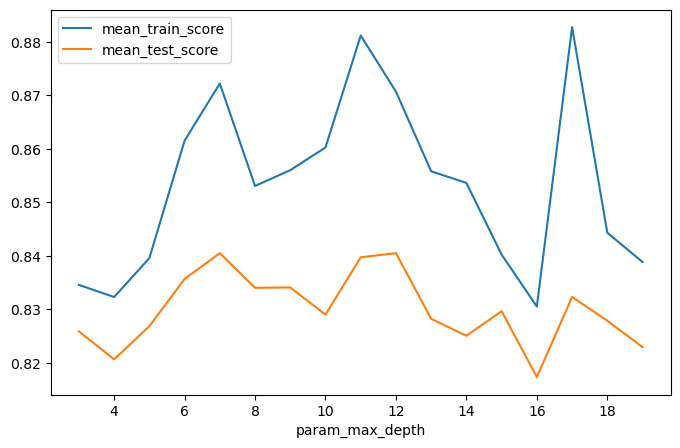

In [260]:
rcv_df.groupby('param_max_depth')[['mean_train_score','mean_test_score']].mean().plot(figsize=[8,5])
plt.show()

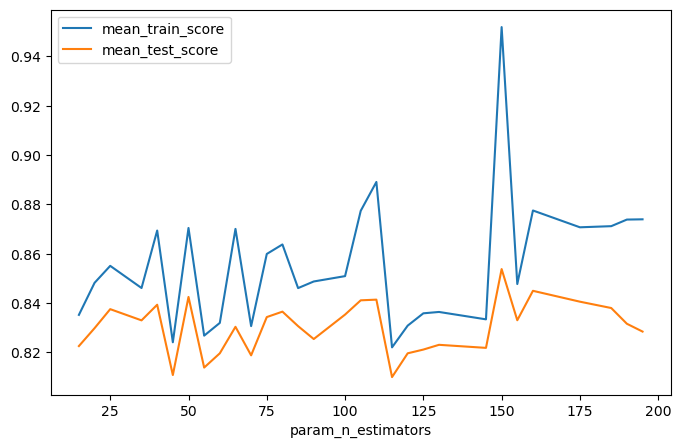

In [261]:
rcv_df.groupby('param_n_estimators')[['mean_train_score', 'mean_test_score']].agg(np.mean).plot(figsize=[8,5])
plt.show()

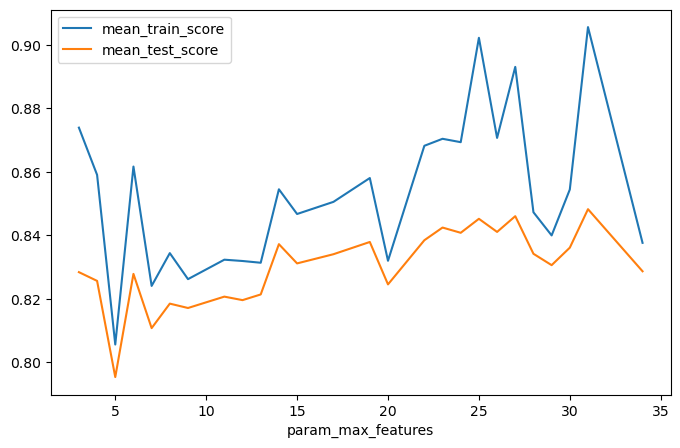

In [262]:
rcv_df.groupby('param_max_features')[['mean_train_score', 'mean_test_score']].agg(np.median).plot(figsize=[8,5])
plt.show()

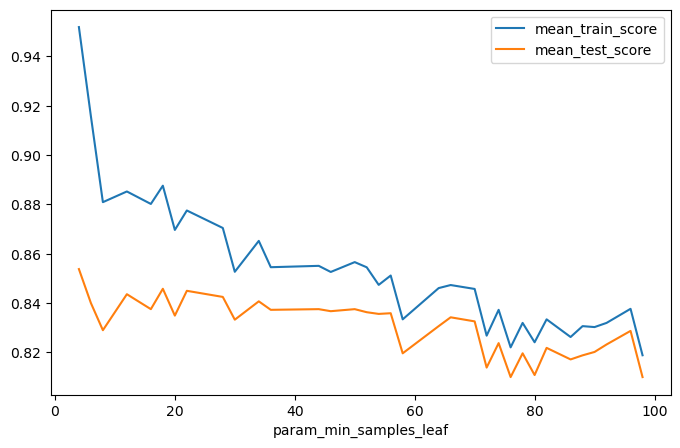

In [263]:
rcv_df.groupby('param_min_samples_leaf')[['mean_train_score', 'mean_test_score']].agg(np.median).plot(figsize=[8,5])
plt.show()

In [264]:
rf = RandomForestClassifier(random_state=42, n_jobs=-1, min_samples_leaf=5, max_features=12, n_estimators=145, max_depth=9)

In [265]:
rf.fit(X_resampled_us, y_resampled_us)

RandomForestClassifier(max_depth=9, max_features=12, min_samples_leaf=5,
                       n_estimators=145, n_jobs=-1, random_state=42)

In [266]:
y_train_pred = rf.predict(X_resampled_us)

In [267]:
accuracy_score(y_resampled_us, y_train_pred)

0.9195592286501377

In [268]:
recall_score(y_resampled_us, y_train_pred)

0.8892561983471075

**Test Set performance**

In [270]:
y_test_pred = rf.predict(X_test)

In [271]:
accuracy_score(y_test, y_test_pred)

0.917258996001777

## Plotting feature importance

In [273]:
feats = X_resampled_us.columns

for feature in zip(feats, rf.feature_importances_):
    print(feature)

('arpu_6', 0.005015993378763232)
('arpu_7', 0.008888621824641204)
('arpu_8', 0.02856677057278952)
('onnet_mou_6', 0.0037971335164467)
('onnet_mou_7', 0.004596034283381853)
('onnet_mou_8', 0.015825367441566394)
('offnet_mou_6', 0.004453293336968031)
('offnet_mou_7', 0.00606492343030029)
('offnet_mou_8', 0.027577962850446936)
('roam_ic_mou_6', 0.0015846624654704215)
('roam_ic_mou_7', 0.0023597450009165766)
('roam_ic_mou_8', 0.03343605517908765)
('roam_og_mou_6', 0.0012813043249502547)
('roam_og_mou_7', 0.0025611219278258205)
('roam_og_mou_8', 0.03893105882822358)
('loc_og_t2t_mou_6', 0.0039018743726550887)
('loc_og_t2t_mou_7', 0.005481865461399437)
('loc_og_t2t_mou_8', 0.032413836602319605)
('loc_og_t2m_mou_6', 0.004132543621296045)
('loc_og_t2m_mou_7', 0.004726363972031271)
('loc_og_t2m_mou_8', 0.037253618388755974)
('loc_og_t2f_mou_6', 0.002487279393913503)
('loc_og_t2f_mou_7', 0.0017108459831677789)
('loc_og_t2f_mou_8', 0.0069452448098382144)
('loc_og_t2c_mou_6', 0.0006683815047373302

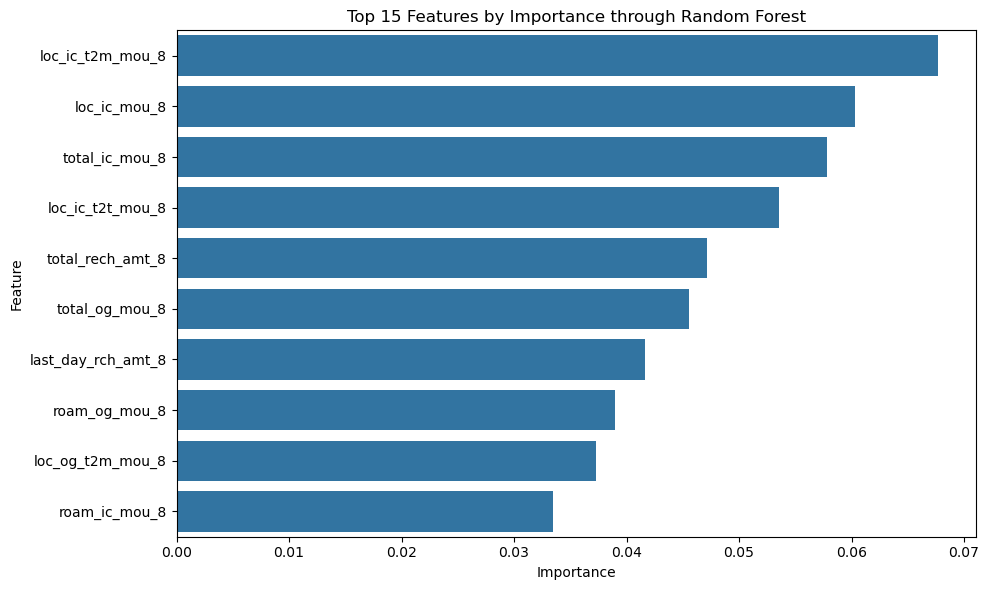

In [476]:
feature_importance_df = pd.DataFrame({'Feature': feats, 'Importance': rf.feature_importances_})
feature_importance_df = feature_importance_df.sort_values('Importance', ascending=False)

plt.figure(figsize=(10, 6))
ax = sns.barplot(x='Importance', y='Feature', data=feature_importance_df.head(10))
plt.title('Top 15 Features by Importance through Random Forest')
plt.tight_layout()
plt.show()

## Recommendations

1. The company should track the users local incoming and outgoing calls regularly as when these start dropping drastically from the usual level, it indicates that the user is planning to change telecom service providers.

2. Another indicator that the user is planning to churn is the change in the recharge amount. If the value of the user's recharge amount also falls drastically, that is another indicator that user may be switching to another competitor service.

3. A decrease in user's incoming / outgoing roaming usage is another sign of customer's churn from the company's telecom services.

4. If a drastic change in seen in any one of the indicators above, the company should try to retain the customer by checking and resolving the problems faced by the customer as well as offering additional benefits in terms of cheaper call package, customized plans/ offers, exclusive benefits and targeted communication. 